###  Import necessary library

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.datasets as dt
import sklearn.model_selection as ms
import sklearn.tree as tr
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import seaborn as sns

### Import Dataset

In [38]:

data_1=pd.read_csv('C:/Users/hp/Downloads/Myocardial_infarction_complications_Database_2.csv')

print(data_1)
data_1.head()

        ID   AGE  SEX  INF_ANAM  STENOK_AN  FK_STENOK  IBS_POST  IBS_NASL  \
0        1  77.0    1       2.0        1.0        1.0       2.0       NaN   
1        2  55.0    1       1.0        0.0        0.0       0.0       0.0   
2        3  52.0    1       0.0        0.0        0.0       2.0       NaN   
3        4  68.0    0       0.0        0.0        0.0       2.0       NaN   
4        5  60.0    1       0.0        0.0        0.0       2.0       NaN   
...    ...   ...  ...       ...        ...        ...       ...       ...   
1695  1696  77.0    0       0.0        4.0        2.0       1.0       NaN   
1696  1697  70.0    0       0.0        6.0        2.0       1.0       NaN   
1697  1698  55.0    1       3.0        6.0        2.0       2.0       NaN   
1698  1699  79.0    0       2.0        2.0        2.0       1.0       NaN   
1699  1700  63.0    1       2.0        NaN        NaN       NaN       NaN   

       GB  SIM_GIPERT  ...  JELUD_TAH  FIBR_JELUD  A_V_BLOK  OTEK_LANC  \
0

,ID,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,IBS_NASL,GB,SIM_GIPERT,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,1,77.0,1,2.0,1.0,1.0,2.0,NaN,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,2,55.0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,3,52.0,1,0.0,0.0,0.0,2.0,NaN,2.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,4,68.0,0,0.0,0.0,0.0,2.0,NaN,2.0,0.0,...,0,0,0,0,0,0,1,0,0,0
4,5,60.0,1,0.0,0.0,0.0,2.0,NaN,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0


###### Dropping unnecessary columns

In [39]:
df = data_1.drop(["ID","IBS_NASL", "R_AB_1_n", "R_AB_2_n", "R_AB_3_n", "NA_R_1_n", "NA_R_2_n","KFK_BLOOD", "NA_R_3_n", "NOT_NA_1_n", "NOT_NA_2_n", "NOT_NA_3_n"], axis=1)


In [40]:
df.head()

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,GB,SIM_GIPERT,DLIT_AG,ZSN_A,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,77.0,1,2.0,1.0,1.0,2.0,3.0,0.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,55.0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,52.0,1,0.0,0.0,0.0,2.0,2.0,0.0,2.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,68.0,0,0.0,0.0,0.0,2.0,2.0,0.0,3.0,1.0,...,0,0,0,0,0,0,1,0,0,0
4,60.0,1,0.0,0.0,0.0,2.0,3.0,0.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,0


### Sanity check of data

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Columns: 112 entries, AGE to LET_IS
dtypes: float64(99), int64(13)
memory usage: 1.5 MB


In [42]:
#Checking null values in columns
df.isnull().sum()/df.shape[0]*100

AGE          0.470588
SEX          0.000000
INF_ANAM     0.235294
STENOK_AN    6.235294
FK_STENOK    4.294118
               ...   
DRESSLER     0.000000
ZSN          0.000000
REC_IM       0.000000
P_IM_STEN    0.000000
LET_IS       0.000000
Length: 112, dtype: float64

In [43]:
#Finding  duplicates 
df.drop_duplicates()

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,GB,SIM_GIPERT,DLIT_AG,ZSN_A,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
0,77.0,1,2.0,1.0,1.0,2.0,3.0,0.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,55.0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,52.0,1,0.0,0.0,0.0,2.0,2.0,0.0,2.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,68.0,0,0.0,0.0,0.0,2.0,2.0,0.0,3.0,1.0,...,0,0,0,0,0,0,1,0,0,0
4,60.0,1,0.0,0.0,0.0,2.0,3.0,0.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,77.0,0,0.0,4.0,2.0,1.0,2.0,0.0,7.0,0.0,...,0,0,1,0,1,0,0,0,0,3
1696,70.0,0,0.0,6.0,2.0,1.0,2.0,0.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,1
1697,55.0,1,3.0,6.0,2.0,2.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,6
1698,79.0,0,2.0,2.0,2.0,1.0,2.0,0.0,7.0,NaN,...,0,0,0,1,0,0,0,0,0,1


## Exploratory Data Analysis (EDA)


In [44]:
df.describe()

,AGE,SEX,INF_ANAM,STENOK_AN,FK_STENOK,IBS_POST,GB,SIM_GIPERT,DLIT_AG,ZSN_A,...,JELUD_TAH,FIBR_JELUD,A_V_BLOK,OTEK_LANC,RAZRIV,DRESSLER,ZSN,REC_IM,P_IM_STEN,LET_IS
count,1692.000000,1700.000000,1696.000000,1594.000000,1627.000000,1649.000000,1691.000000,1692.000000,1452.000000,1646.000000,...,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000
mean,61.856974,0.626471,0.554835,2.316186,1.205286,1.160703,1.393258,0.033688,3.340220,0.194411,...,0.024706,0.041765,0.033529,0.093529,0.031765,0.044118,0.231765,0.093529,0.087059,0.477059
std,11.259936,0.483883,0.836801,2.440586,1.040814,0.801400,1.088803,0.180478,3.098646,0.658722,...,0.155273,0.200110,0.180067,0.291259,0.175425,0.205417,0.422084,0.291259,0.282004,1.381818
min,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,54.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,63.000000,1.000000,0.000000,1.000000,2.000000,1.000000,2.000000,0.000000,3.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,70.000000,1.000000,1.000000,5.000000,2.000000,2.000000,2.000000,0.000000,7.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,92.000000,1.000000,3.000000,6.000000,4.000000,2.000000,3.000000,1.000000,7.000000,4.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [45]:
import pandas as pd

# Assuming df is your DataFrame
total_missing_values = df.isnull().sum().sum()  # Total number of missing values in the entire dataset
total_values = df.size  # Total number of values in the entire dataset

overall_missing_percentage = (total_missing_values / total_values) * 100  # Calculate the overall percentage

# Print the overall percentage of missing values
print(f"Overall percentage of missing values: {overall_missing_percentage:.2f}%")

Overall percentage of missing values: 6.25%


In [46]:
missing_percentage_before = df.isnull().mean() * 100
print("Missing values percentage before imputation:\n", missing_percentage_before)


Missing values percentage before imputation:
 AGE          0.470588
SEX          0.000000
INF_ANAM     0.235294
STENOK_AN    6.235294
FK_STENOK    4.294118
               ...   
DRESSLER     0.000000
ZSN          0.000000
REC_IM       0.000000
P_IM_STEN    0.000000
LET_IS       0.000000
Length: 112, dtype: float64


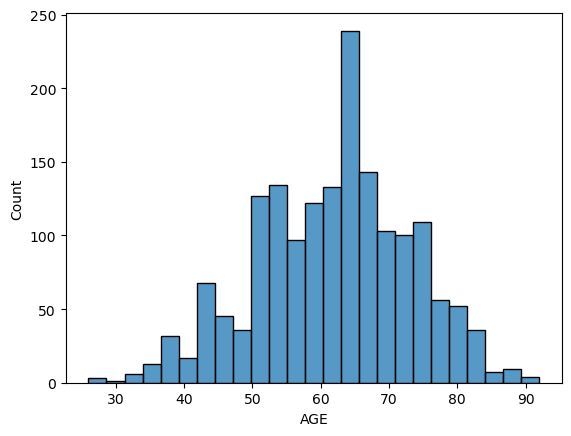

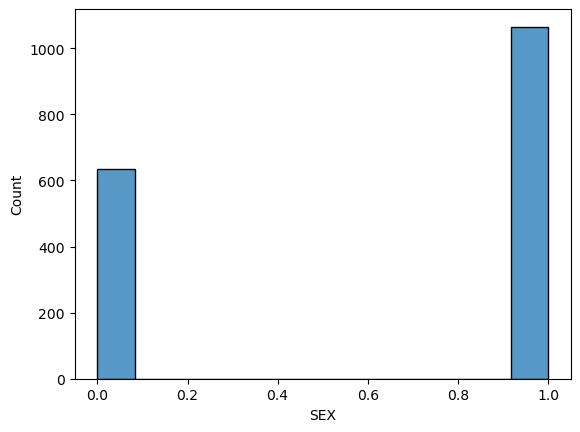

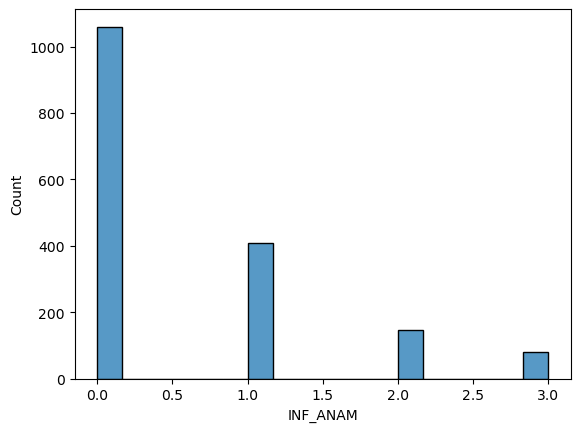

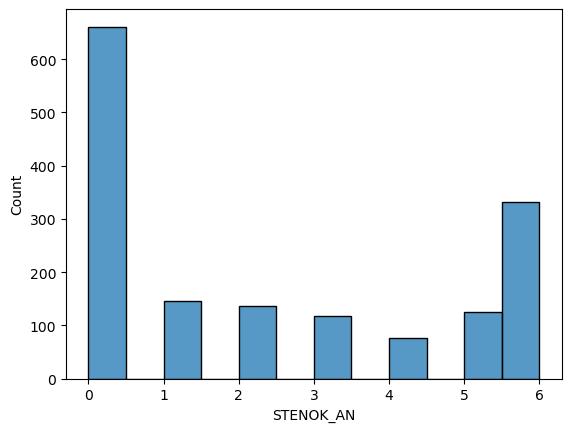

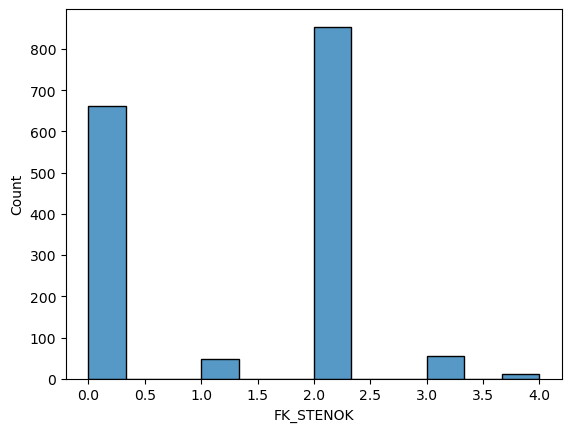

...

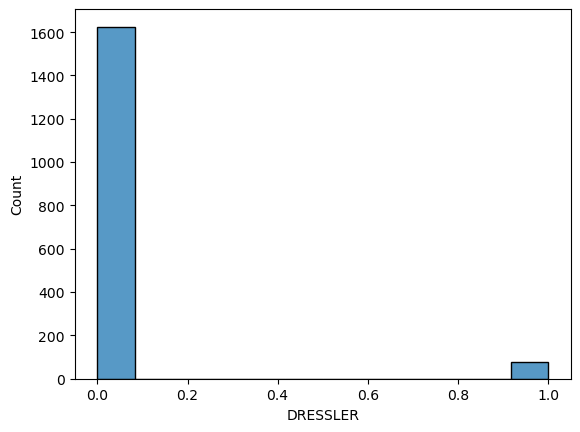

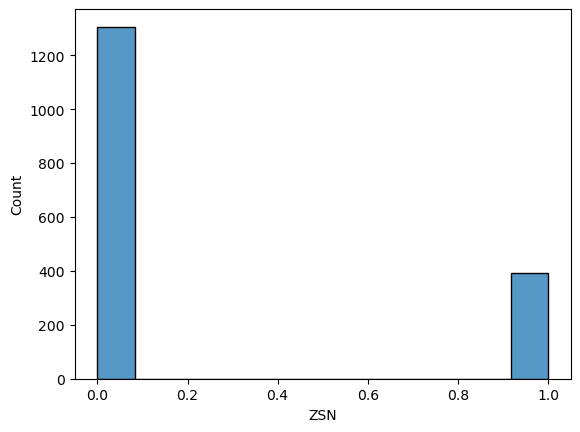

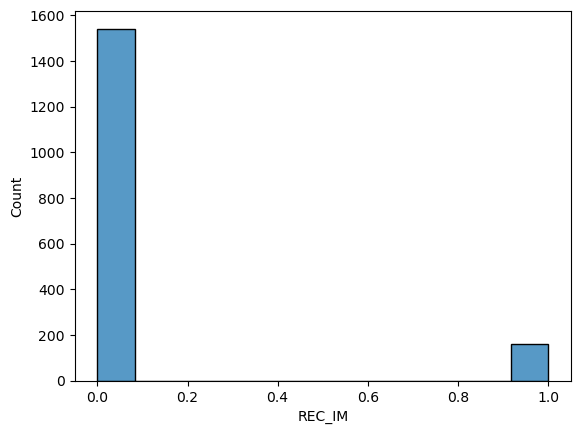

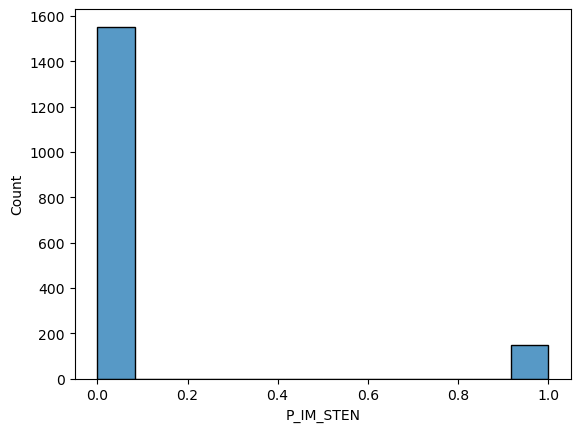

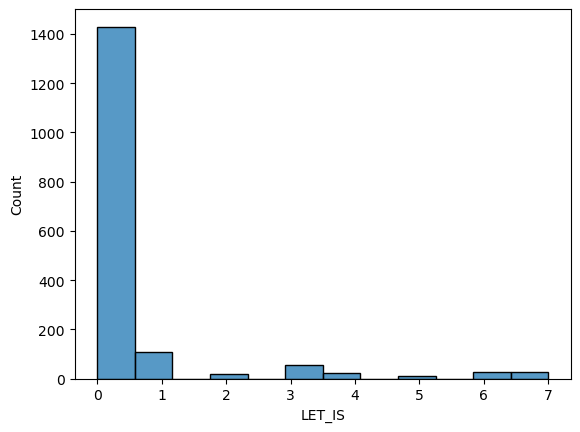

In [47]:
# Histogram to understand the distribution

for i in df.select_dtypes(include="number").columns:
    sns.histplot(data=df,x=i)
    plt.show()

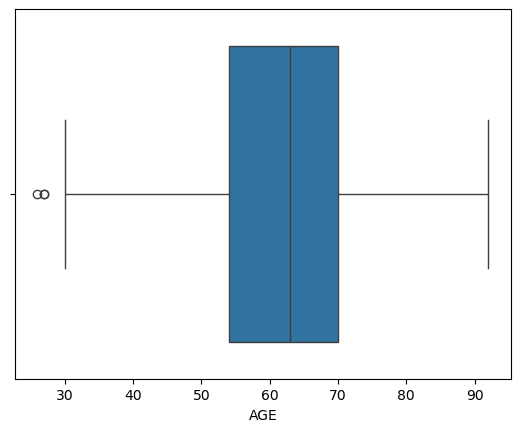

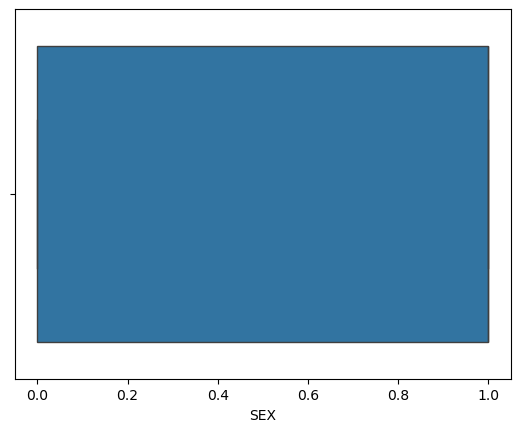

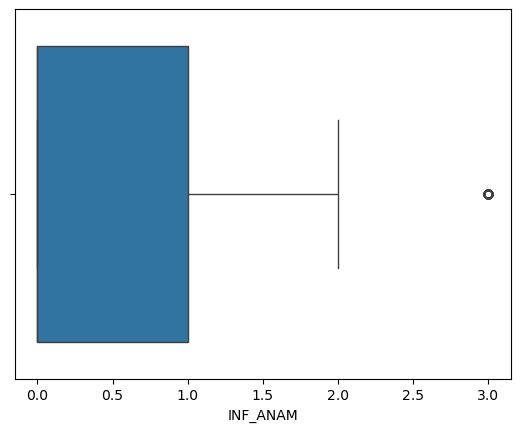

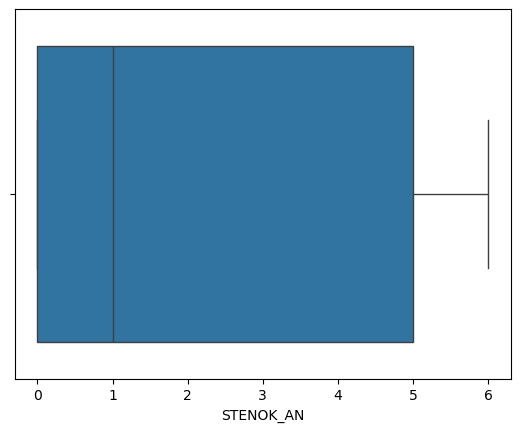

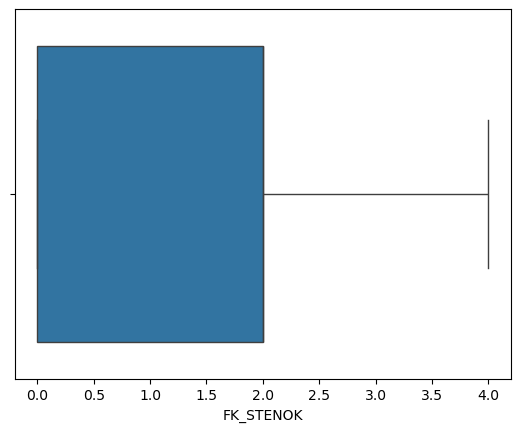

...

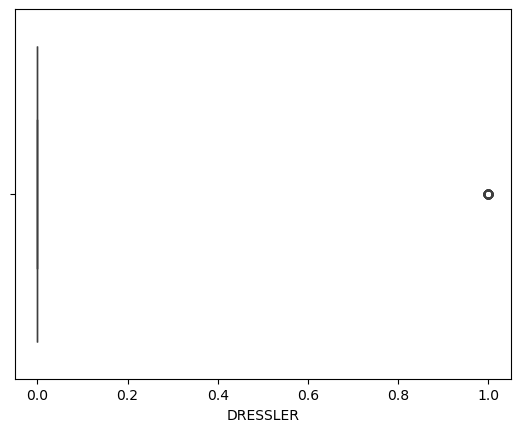

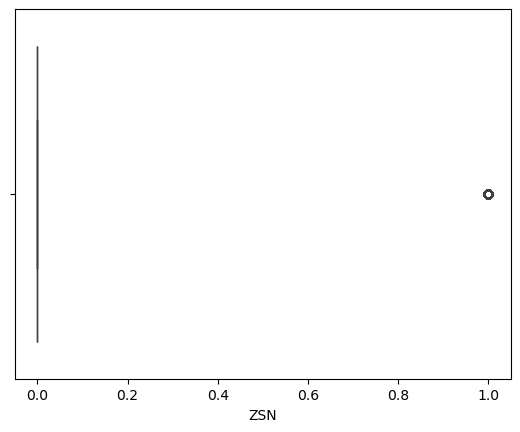

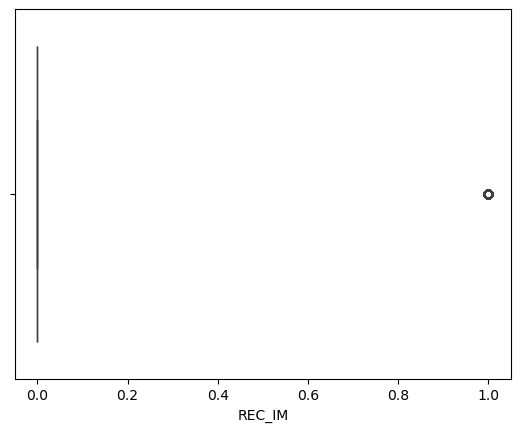

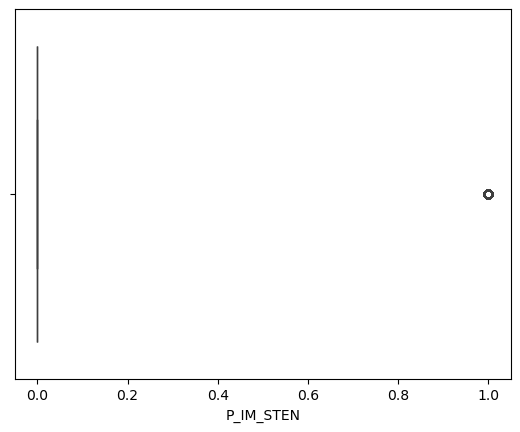

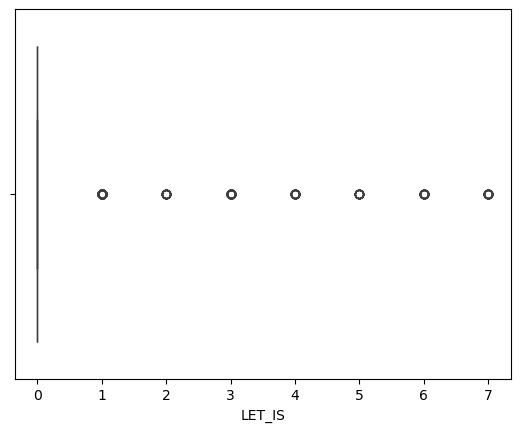

In [48]:
#box plot to find outliers

for i in df.select_dtypes(include="number").columns:
    sns.boxplot(data=df,x=i)
    plt.show()

In [49]:
df.select_dtypes(include='number').columns

Index(['AGE', 'SEX', 'INF_ANAM', 'STENOK_AN', 'FK_STENOK', 'IBS_POST', 'GB',
       'SIM_GIPERT', 'DLIT_AG', 'ZSN_A',
       ...
       'JELUD_TAH', 'FIBR_JELUD', 'A_V_BLOK', 'OTEK_LANC', 'RAZRIV',
       'DRESSLER', 'ZSN', 'REC_IM', 'P_IM_STEN', 'LET_IS'],
      dtype='object', length=112)

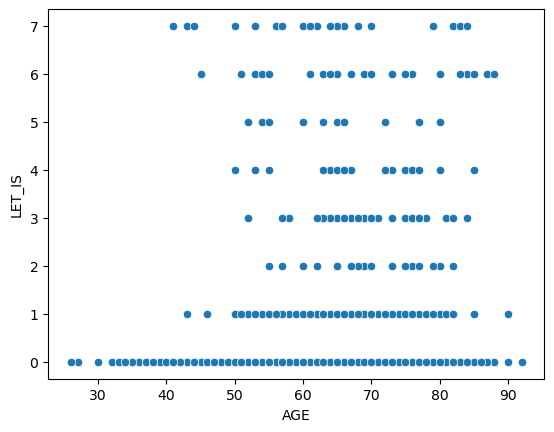

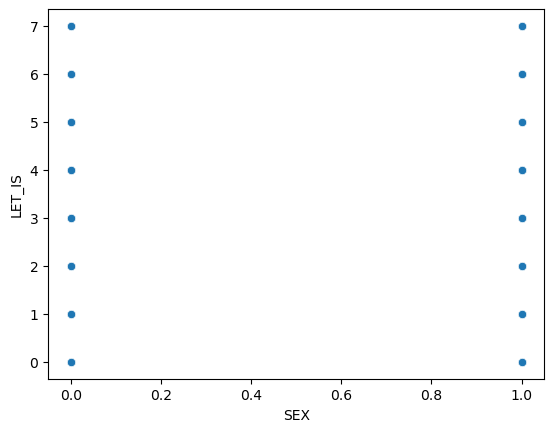

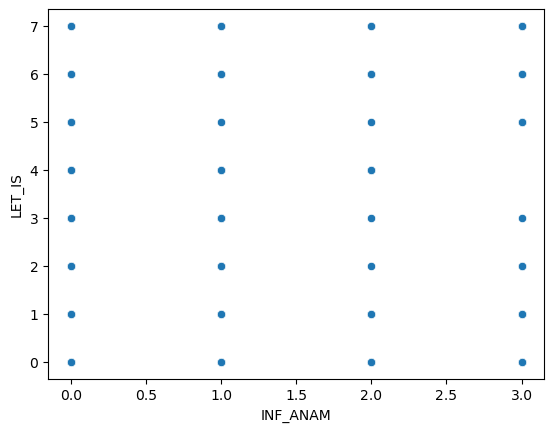

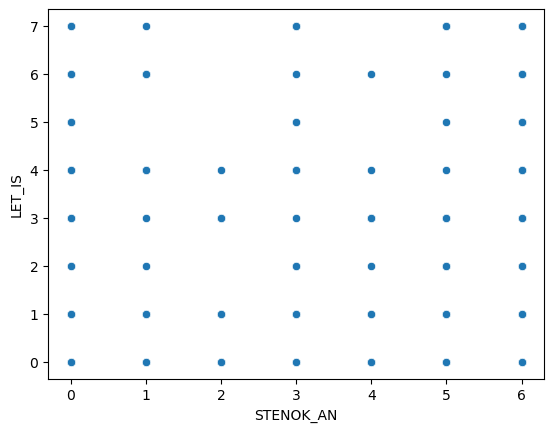

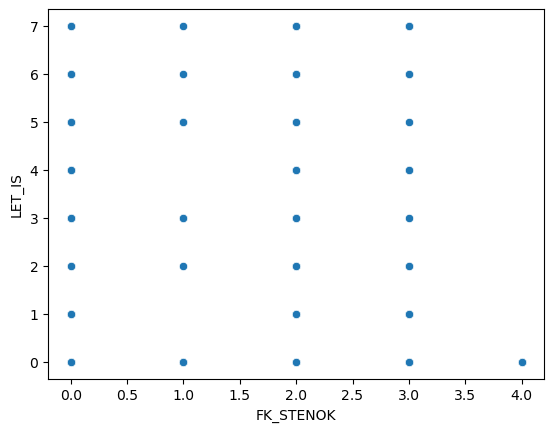

...

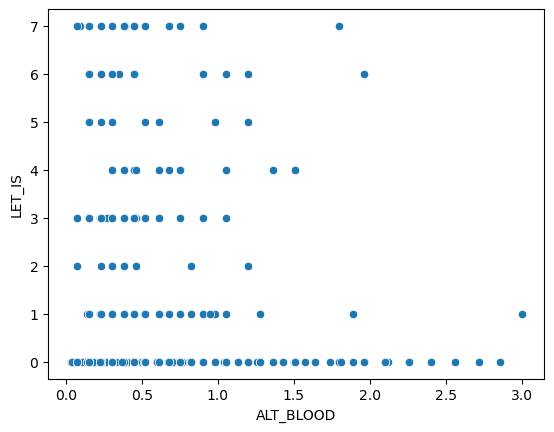

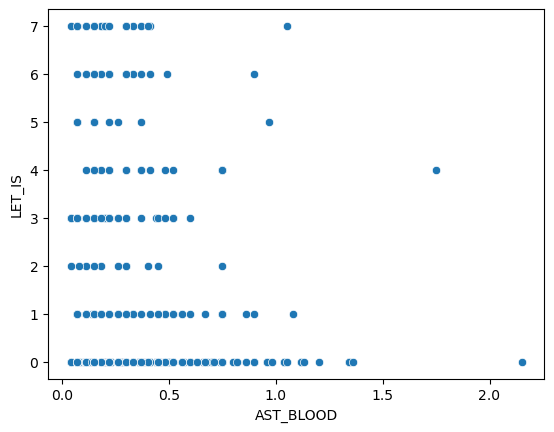

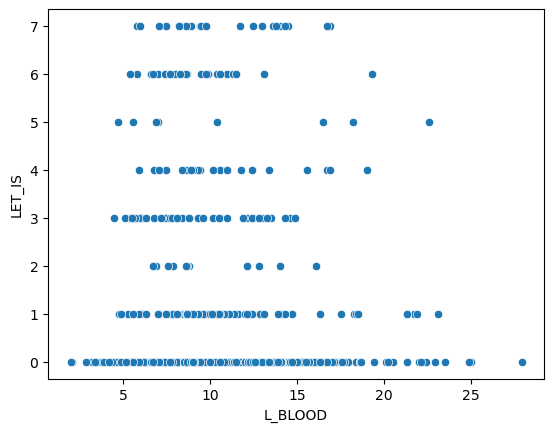

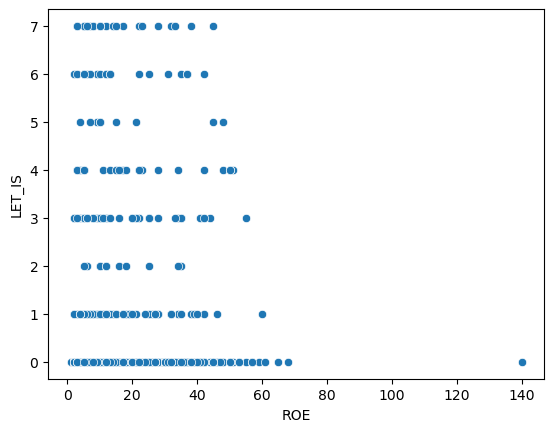

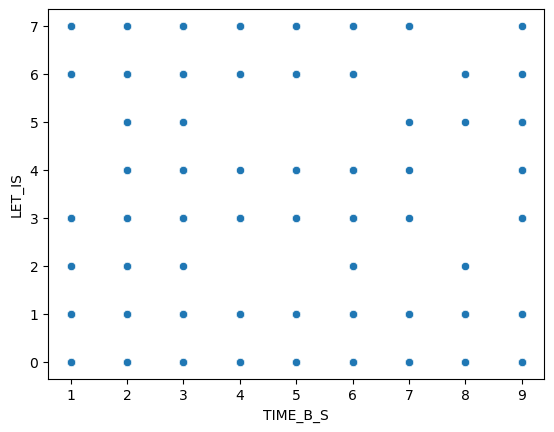

In [50]:
# Scatter plot to indetify the relationship

for i in ['AGE', 'SEX', 'INF_ANAM', 'STENOK_AN', 'FK_STENOK', 'IBS_POST', 'GB',
       'SIM_GIPERT', 'DLIT_AG', 'ZSN_A', 'nr_11', 'nr_01', 'nr_02', 'nr_03',
       'nr_04', 'nr_07', 'nr_08', 'np_01', 'np_04', 'np_05', 'np_07', 'np_08',
       'np_09', 'np_10', 'endocr_01', 'endocr_02', 'endocr_03', 'zab_leg_01',
       'zab_leg_02', 'zab_leg_03', 'zab_leg_04', 'zab_leg_06', 'S_AD_KBRIG',
       'D_AD_KBRIG', 'S_AD_ORIT', 'D_AD_ORIT', 'O_L_POST', 'K_SH_POST',
       'MP_TP_POST', 'SVT_POST', 'GT_POST', 'FIB_G_POST', 'ant_im', 'lat_im',
       'inf_im', 'post_im', 'IM_PG_P', 'ritm_ecg_p_01', 'ritm_ecg_p_02',
       'ritm_ecg_p_04', 'ritm_ecg_p_06', 'ritm_ecg_p_07', 'ritm_ecg_p_08',
       'n_r_ecg_p_01', 'n_r_ecg_p_02', 'n_r_ecg_p_03', 'n_r_ecg_p_04',
       'n_r_ecg_p_05', 'n_r_ecg_p_06', 'n_r_ecg_p_08', 'n_r_ecg_p_09',
       'n_r_ecg_p_10', 'n_p_ecg_p_01', 'n_p_ecg_p_03', 'n_p_ecg_p_04',
       'n_p_ecg_p_05', 'n_p_ecg_p_06', 'n_p_ecg_p_07', 'n_p_ecg_p_08',
       'n_p_ecg_p_09', 'n_p_ecg_p_10', 'n_p_ecg_p_11', 'n_p_ecg_p_12',
       'fibr_ter_01', 'fibr_ter_02', 'fibr_ter_03', 'fibr_ter_05',
       'fibr_ter_06', 'fibr_ter_07', 'fibr_ter_08', 'GIPO_K', 'K_BLOOD',
       'GIPER_NA', 'NA_BLOOD', 'ALT_BLOOD', 'AST_BLOOD', 'L_BLOOD', 'ROE',
       'TIME_B_S']:
    sns.scatterplot(data=df,x=i,y='LET_IS')
    plt.show()

In [51]:
#To find co relation

s=df.select_dtypes(include='number').corr()

<Axes: >

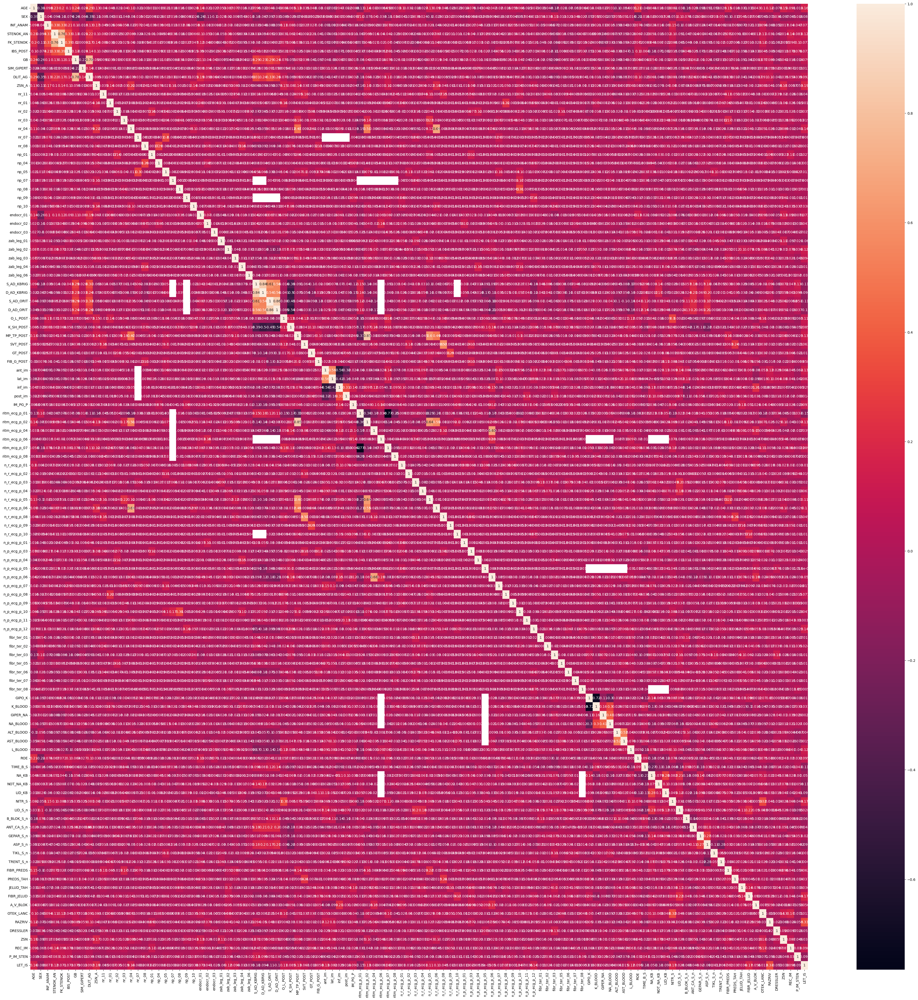

In [52]:
plt.figure(figsize=(50,50))
sns.heatmap(s,annot=True)

### Missing value treatment 

In [53]:
# KNNImputer

from sklearn.impute import KNNImputer
impute=KNNImputer()
for i in df.select_dtypes(include='number').columns:
    df[i]=impute.fit_transform(df[[i]])

In [54]:
df.isnull().sum()

AGE          0
SEX          0
INF_ANAM     0
STENOK_AN    0
FK_STENOK    0
            ..
DRESSLER     0
ZSN          0
REC_IM       0
P_IM_STEN    0
LET_IS       0
Length: 112, dtype: int64

In [55]:
missing_percentage_after = df.isnull().mean() * 100
print("Missing values percentage after imputation:\n", missing_percentage_after)

Missing values percentage after imputation:
 AGE          0.0
SEX          0.0
INF_ANAM     0.0
STENOK_AN    0.0
FK_STENOK    0.0
            ... 
DRESSLER     0.0
ZSN          0.0
REC_IM       0.0
P_IM_STEN    0.0
LET_IS       0.0
Length: 112, dtype: float64


In [56]:
# outliers treatment 

def wisker(col):
    q1,q3=np.percentile(col,[25,75])
    iqr=q3-q1
    lw=q1-1.5*iqr
    uw=q3+1.5*iqr
    return lw,uw

In [57]:
for i in['ALT_BLOOD','AST_BLOOD','L_BLOOD','ROE']:
    lw,uw=wisker(df[i])
    df[i]=np.where(df[i]<lw,lw,df[i])
    df[i]=np.where(df[i]>uw,uw,df[i])
    

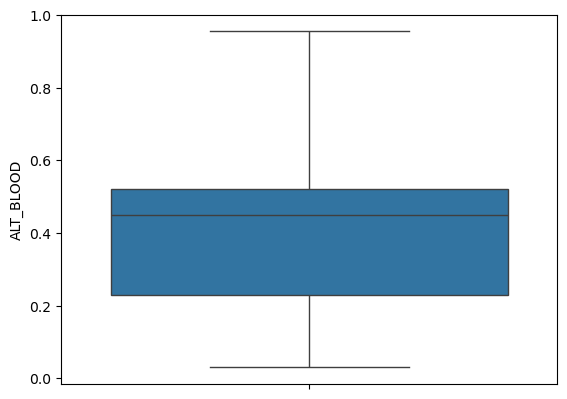

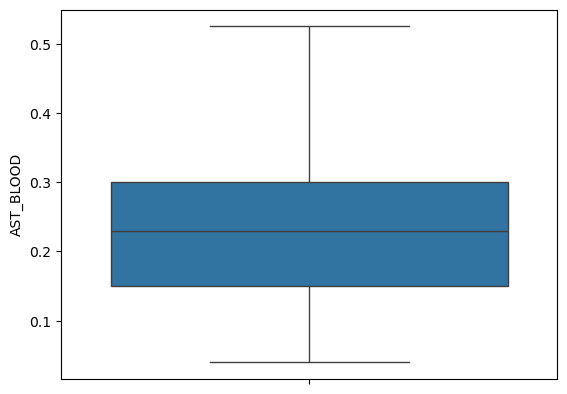

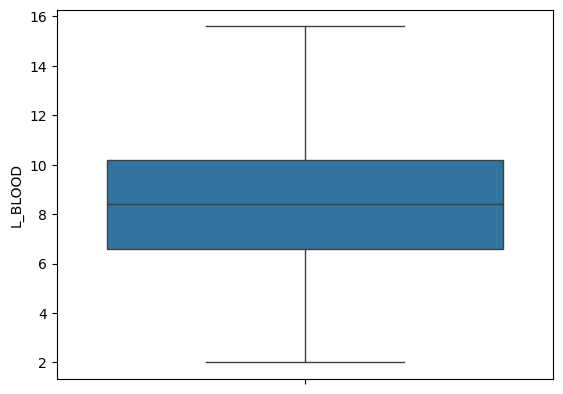

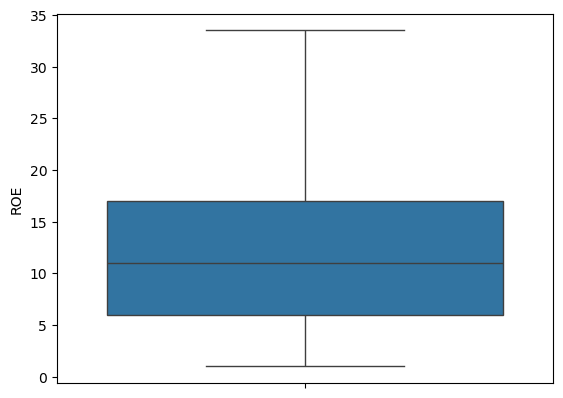

In [58]:
for i in['ALT_BLOOD','AST_BLOOD','L_BLOOD','ROE']:
    sns.boxplot(df[i])
    plt.show()

In [59]:
print(df.columns)

Index(['AGE', 'SEX', 'INF_ANAM', 'STENOK_AN', 'FK_STENOK', 'IBS_POST', 'GB',
       'SIM_GIPERT', 'DLIT_AG', 'ZSN_A',
       ...
       'JELUD_TAH', 'FIBR_JELUD', 'A_V_BLOK', 'OTEK_LANC', 'RAZRIV',
       'DRESSLER', 'ZSN', 'REC_IM', 'P_IM_STEN', 'LET_IS'],
      dtype='object', length=112)


In [60]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Assuming df is already defined

# Create a copy to avoid modifying the original DataFrame
df1 = df.copy()

# Define the columns to encode (check for existence first)
columns_to_encode = ['INF_ANAM', 'STENOK_AN', 'FK_STENOK', 'IBS_POST', 'GB', 'DLIT_AG', 'ZSN_A', 'ant_im', 'lat_im', 'inf_im', 'post_im', 'TIME_B_S']
columns_to_encode = [col for col in columns_to_encode if col in df.columns]

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Encode the specified columns
for col in columns_to_encode:
    df1[col] = label_encoder.fit_transform(df1[col])  # Use df1 for encoding on the copy

print("Label encoding applied to specified columns:")
print(df1.head())


Label encoding applied to specified columns:
    AGE  SEX  INF_ANAM  STENOK_AN  FK_STENOK  IBS_POST  GB  SIM_GIPERT  \
0  77.0  1.0         3          1          1         3   4         0.0   
1  55.0  1.0         2          0          0         0   0         0.0   
2  52.0  1.0         0          0          0         3   3         0.0   
3  68.0  0.0         0          0          0         3   3         0.0   
4  60.0  1.0         0          0          0         3   4         0.0   

   DLIT_AG  ZSN_A  ...  JELUD_TAH  FIBR_JELUD  A_V_BLOK  OTEK_LANC  RAZRIV  \
0        8      0  ...        0.0         0.0       0.0        0.0     0.0   
1        0      0  ...        0.0         0.0       0.0        0.0     0.0   
2        2      0  ...        0.0         0.0       0.0        0.0     0.0   
3        3      2  ...        0.0         0.0       0.0        0.0     0.0   
4        8      0  ...        0.0         0.0       0.0        0.0     0.0   

   DRESSLER  ZSN  REC_IM  P_IM_STEN  LET_

In [61]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Assuming df is already defined
df1 = df.drop(['INF_ANAM', 'STENOK_AN', 'FK_STENOK', 'IBS_POST', 'GB', 'DLIT_AG', 'ZSN_A', 'ant_im', 'lat_im', 'inf_im', 'post_im', 'TIME_B_S'], axis=1)

# Define the columns to encode
columns_to_encode = ['INF_ANAM', 'STENOK_AN', 'FK_STENOK', 'IBS_POST', 'GB', 'DLIT_AG', 'ZSN_A', 'ant_im', 'lat_im', 'inf_im', 'post_im', 'TIME_B_S']
columns_to_encode = [col for col in columns_to_encode if col in df.columns]  # Ensure columns exist in original df

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to the specified columns
for col in columns_to_encode:
    df1[col] = label_encoder.fit_transform(df[col])  # Use df[col] for encoding

print("Label encoding applied to specified columns:")
print(df1.head())

print(df1['TIME_B_S'])

Label encoding applied to specified columns:
    AGE  SEX  SIM_GIPERT  nr_11  nr_01  nr_02  nr_03  nr_04  nr_07  nr_08  \
0  77.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
1  55.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
2  52.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
3  68.0  0.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
4  60.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   

   ...  FK_STENOK  IBS_POST  GB  DLIT_AG  ZSN_A  ant_im  lat_im  inf_im  \
0  ...          1         3   4        8      0       1       0       0   
1  ...          0         0   0        0      0       5       2       0   
2  ...          0         3   3        2      0       5       2       0   
3  ...          0         3   3        3      2       0       2       1   
4  ...          0         3   4        8      0       5       2       0   

   post_im  TIME_B_S  
0        0        

C:\Users\hp\AppData\Local\Temp\ipykernel_13808\4182338775.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df1[col] = label_encoder.fit_transform(df[col])  # Use df[col] for encoding
C:\Users\hp\AppData\Local\Temp\ipykernel_13808\4182338775.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df1[col] = label_encoder.fit_transform(df[col])  # Use df[col] for encoding
C:\Users\hp\AppData\Local\Temp\ipykernel_13808\4182338775.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `fra

In [62]:
df1.info()
print(df1)
print(df1.columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Columns: 112 entries, AGE to TIME_B_S
dtypes: float64(100), int64(12)
memory usage: 1.5 MB
       AGE  SEX  SIM_GIPERT  nr_11  nr_01  nr_02  nr_03  nr_04  nr_07  nr_08  \
0     77.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
1     55.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
2     52.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
3     68.0  0.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
4     60.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
...    ...  ...         ...    ...    ...    ...    ...    ...    ...    ...   
1695  77.0  0.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
1696  70.0  0.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
1697  55.0  1.0         0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
1698  79.0  0.0         0.0    0.0 

(1700, 111)


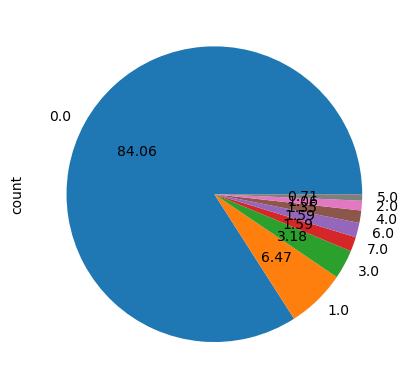

In [63]:
x = df1.drop("LET_IS", axis=1)
y = df1["LET_IS"]

# Target value destribution before SMOTE
ax=y.value_counts().plot.pie(autopct='%.2f')
print(x.shape)

In [64]:
# Check for NaN values in X
nan_values = x.isnull().sum()

# Print columns with NaN values (if any)
print("Columns with NaN values:")
print(nan_values[nan_values > 0])

Columns with NaN values:
Series([], dtype: int64)


### Developing ML models

In [65]:
# Importing necessary library

import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.datasets import make_classification
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, accuracy_score


In [66]:
# Instantiate the SMOTE class
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data
X_resampled, y_resampled = smote.fit_resample(x, y)

In [67]:
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_resampled)

# Apply PCA for feature selection
pca = PCA(n_components=0.95)  # Retain 95% of variance
X_pca = pca.fit_transform(X_scaled)

print(X_pca.shape)

(11432, 85)


###  SMOTE (Synthetic Minority Over-sampling Technique)

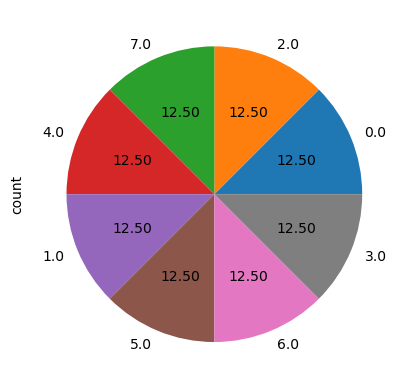

In [68]:
# Target value destribution after applying  SMOTE
ax=y_resampled.value_counts().plot.pie(autopct='%.2f')

In [69]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_resampled, test_size=0.2, random_state=42)


### model 1- Random Forest Classifier

## Bagging classifier- RF

In [70]:
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, classification_report

# Load your dataset
# X, y = load_your_data()  # Replace this with your data loading code

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_resampled, test_size=0.2, random_state=42)

# Define the base model - Random Forest Classifier with adjusted parameters
base_model_rf = RandomForestClassifier(n_estimators=100, class_weight='balanced')

# Define the parameter grid with more regularization for Random Forest
param_grid_rf = {
    'max_depth': [10, 20, 30],  # Reduced maximum depth of the tree
    'min_samples_split': [10, 15, 20],  # Increased minimum number of samples required to split an internal node
    'min_samples_leaf': [4, 6, 8]  # Increased minimum number of samples required to be at a leaf node
}

# Instantiate the GridSearchCV object for Random Forest
grid_search_rf = GridSearchCV(estimator=base_model_rf, param_grid=param_grid_rf, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Perform grid search on the Random Forest model
grid_search_rf.fit(X_train, y_train)

# Print the best parameters found for Random Forest
print("Best parameters found for Random Forest:")
print(grid_search_rf.best_params_)

# Get the best Random Forest model
best_model_rf = grid_search_rf.best_estimator_

bagging_model_rf = BaggingClassifier(estimator=best_model_rf, n_estimators=10, random_state=42, n_jobs=-1)

# Train the BaggingClassifier on the training data
bagging_model_rf.fit(X_train, y_train)

# Predict on the training set using BaggingClassifier with Random Forest
y_train_pred_bag_rf = bagging_model_rf.predict(X_train)

# Predict on the test set using BaggingClassifier with Random Forest
y_test_pred_bag_rf = bagging_model_rf.predict(X_test)

# Calculate training accuracy for BaggingClassifier with Random Forest
train_accuracy_bag_rf = accuracy_score(y_train, y_train_pred_bag_rf)

# Calculate testing accuracy for BaggingClassifier with Random Forest
test_accuracy_bag_rf = accuracy_score(y_test, y_test_pred_bag_rf)

# Print training and testing accuracy for BaggingClassifier with Random Forest
print("Bagging with Random Forest Training Accuracy: {:.2f}%".format(train_accuracy_bag_rf * 100))
print("Bagging with Random Forest Testing Accuracy: {:.2f}%".format(test_accuracy_bag_rf * 100))

# Print classification report for BaggingClassifier with Random Forest
print("Bagging with Random Forest Classification Report:")
print(classification_report(y_test, y_test_pred_bag_rf))


Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters found for Random Forest:
{'max_depth': 30, 'min_samples_leaf': 4, 'min_samples_split': 10}
Bagging with Random Forest Training Accuracy: 99.89%
Bagging with Random Forest Testing Accuracy: 99.13%
Bagging with Random Forest Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.93      0.96       292
         1.0       0.97      1.00      0.98       279
         2.0       0.99      1.00      1.00       307
         3.0       1.00      1.00      1.00       292
         4.0       0.99      1.00      0.99       275
         5.0       1.00      1.00      1.00       277
         6.0       1.00      1.00      1.00       309
         7.0       0.98      1.00      0.99       256

    accuracy                           0.99      2287
   macro avg       0.99      0.99      0.99      2287
weighted avg       0.99      0.99      0.99      2287



In [31]:

accuracy = accuracy_score(y_test, y_test_pred_bag_rf )
print("Prediction Accuracy for random forest :", accuracy)

Prediction Accuracy for random forest : 0.989943156974202


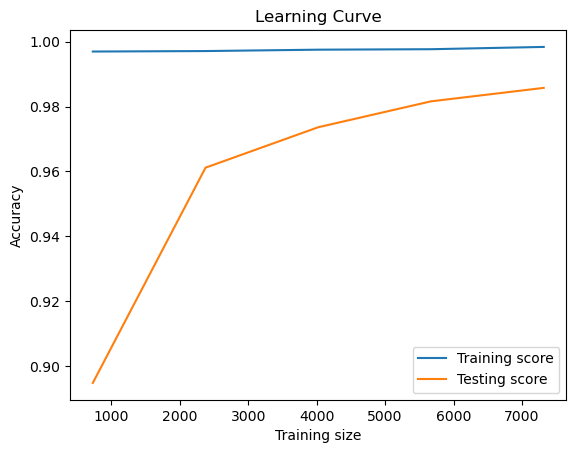

In [28]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, validation_curve

# Plot learning curves to visualize overfitting
train_sizes, train_scores, test_scores = learning_curve(bagging_model_rf, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_scores_mean = train_scores.mean(axis=1)
test_scores_mean = test_scores.mean(axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, test_scores_mean, label='Testing score')
plt.xlabel('Training size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()


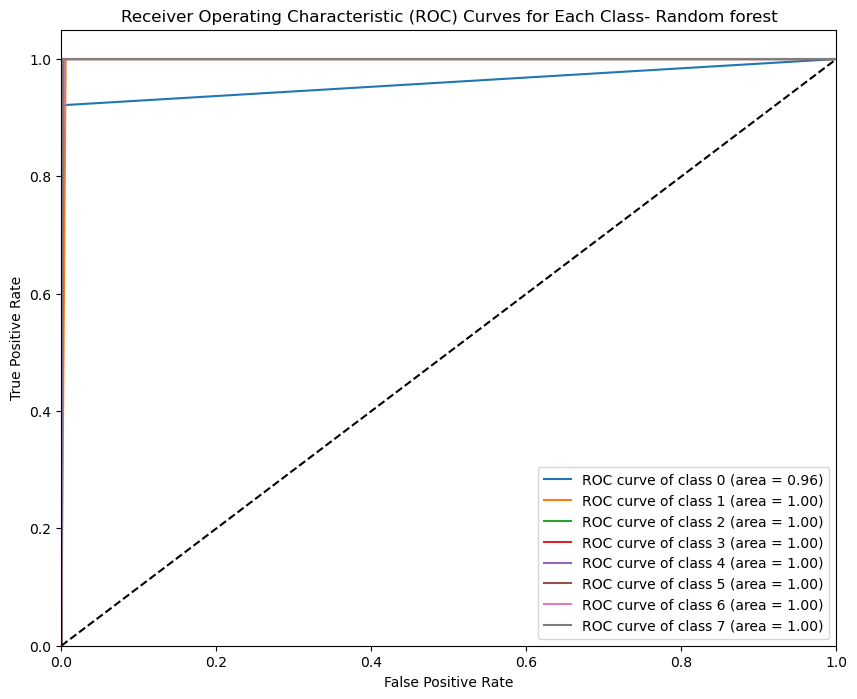

In [29]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Ensure you have 8 target variables
n_classes = 8
# Calculate ROC curve and ROC AUC for each class

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i,y_test_pred_bag_rf  == i)
    roc_auc[i] = roc_auc_score(y_test == i, y_test_pred_bag_rf == i)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves for Each Class- Random forest')
plt.legend(loc='lower right')
plt.show()


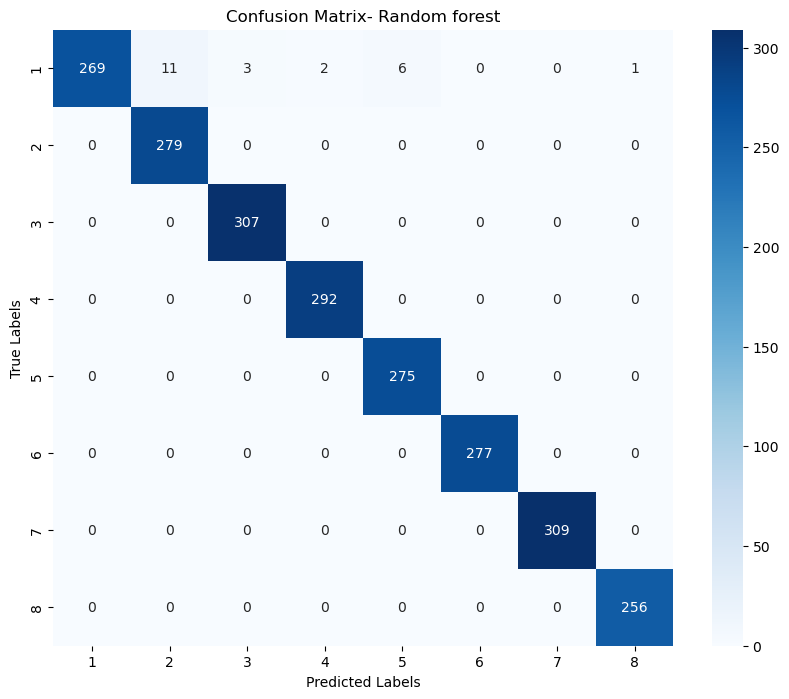

In [30]:
# Calculate confusion matrix
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

cm = confusion_matrix(y_test, y_test_pred_bag_rf)

# Display confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=range(1, 9), yticklabels=range(1, 9))
plt.title("Confusion Matrix- Random forest")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

### model 2 - XGBClassifier

##  Bagging _ XGB

In [32]:
#XGBClassifier

from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

# Define the model - Random Forest Classifier
model_XGB = XGBClassifier(n_estimators=100, max_depth=40, min_samples_leaf=4, min_samples_split=2, class_weight='balanced')

# Define the parameter grid
param_grid = {
    'max_depth': [None, 10, 20, 30, 40, 50],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required to be at a leaf node
}

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(estimator=model_XGB, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Perform grid search on the data (assuming X_train and y_train are your training data)
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found:")
print(grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_


bagging_model_XGB = BaggingClassifier(estimator=best_model, n_estimators=10, random_state=42, n_jobs=-1)

# Train the BaggingClassifier on the training data
bagging_model_XGB.fit(X_train, y_train)

# Predict on the training set using BaggingClassifier with Random Forest
y_train_pred_bag_XGB = bagging_model_XGB.predict(X_train)

# Predict on the test set using BaggingClassifier with Random Forest
y_test_pred_bag_XGB = bagging_model_XGB.predict(X_test)

# Calculate training accuracy for BaggingClassifier with Random Forest
train_accuracy_bag_XGB = accuracy_score(y_train, y_train_pred_bag_XGB)

# Calculate testing accuracy for BaggingClassifier with Random Forest
test_accuracy_bag_XGB = accuracy_score(y_test, y_test_pred_bag_XGB)

# Print training and testing accuracy for BaggingClassifier with Random Forest
print("Bagging with XGB Training Accuracy: {:.2f}%".format(train_accuracy_bag_XGB * 100))
print("Bagging with Random XGB Testing Accuracy: {:.2f}%".format(test_accuracy_bag_XGB * 100))

# Print classification report for BaggingClassifier with Random Forest
print("Bagging with XGB Classification Report:")
print(classification_report(y_test, y_test_pred_bag_XGB))

accuracy = accuracy_score(y_test, y_test_pred_bag_XGB )
print("Prediction Accuracy for random forest :", accuracy)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


C:\Users\hp\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:30:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-06abd128ca6c1688d-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "class_weight", "min_samples_leaf", "min_samples_split" } are not used.

  warnings.warn(smsg, UserWarning)


Best parameters found:
{'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2}
Bagging with XGB Training Accuracy: 99.96%
Bagging with Random XGB Testing Accuracy: 99.26%
Bagging with XGB Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.95      0.97       292
         1.0       0.98      1.00      0.99       279
         2.0       0.99      1.00      1.00       307
         3.0       1.00      1.00      1.00       292
         4.0       0.98      1.00      0.99       275
         5.0       1.00      1.00      1.00       277
         6.0       1.00      1.00      1.00       309
         7.0       1.00      1.00      1.00       256

    accuracy                           0.99      2287
   macro avg       0.99      0.99      0.99      2287
weighted avg       0.99      0.99      0.99      2287

Prediction Accuracy for random forest : 0.9925666812418015


C:\Users\hp\anaconda3\Lib\site-packages\joblib\externals\loky\process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
C:\Users\hp\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
6 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\hp\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\hp\anaconda3\Lib\site-packages\sklearn\utils\validati

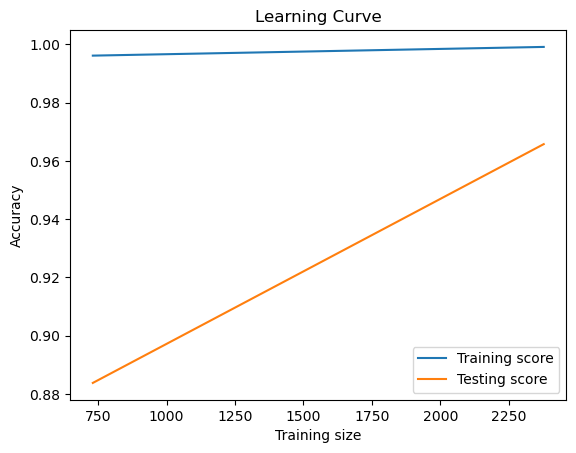

In [35]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, validation_curve

# Plot learning curves to visualize overfitting
train_sizes, train_scores, test_scores = learning_curve(bagging_model_XGB, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_scores_mean = train_scores.mean(axis=1)
test_scores_mean = test_scores.mean(axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, test_scores_mean, label='Testing score')
plt.xlabel('Training size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()


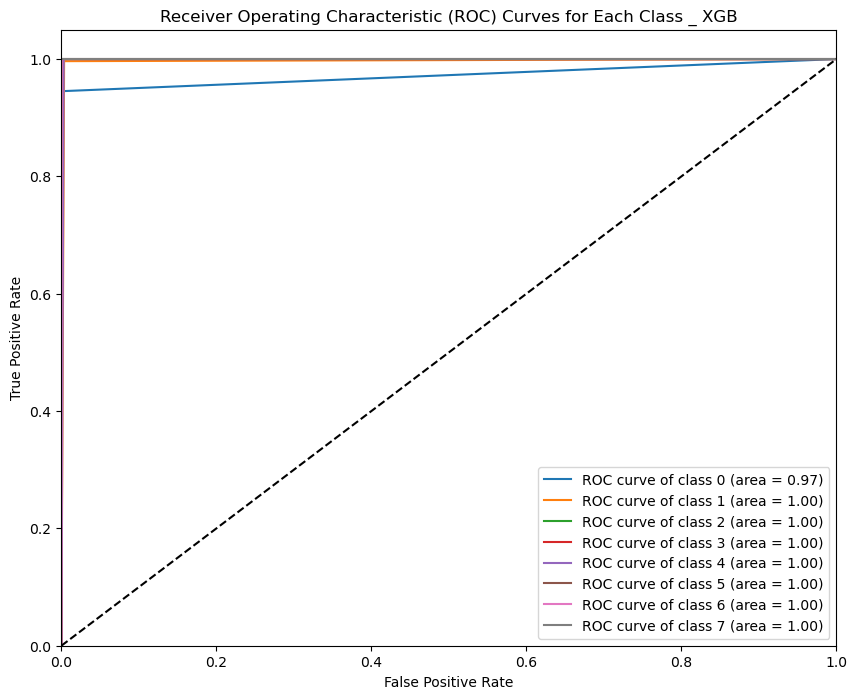

In [36]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Ensure you have 8 target variables
n_classes = 8
# Calculate ROC curve and ROC AUC for each class

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i,y_test_pred_bag_XGB  == i)
    roc_auc[i] = roc_auc_score(y_test == i, y_test_pred_bag_XGB == i)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves for Each Class _ XGB')
plt.legend(loc='lower right')
plt.show()


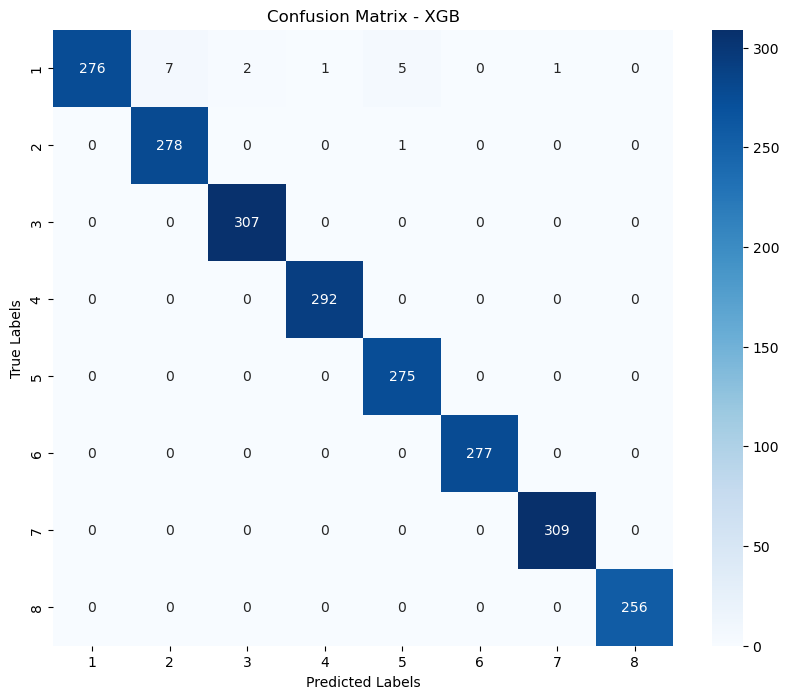

In [37]:
# Calculate confusion matrix
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

cm = confusion_matrix(y_test, y_test_pred_bag_XGB)

# Display confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=range(1, 9), yticklabels=range(1, 9))
plt.title("Confusion Matrix - XGB")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

### Model 3-  SVM

In [41]:
#SVM

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import classification_report

# Instantiate the SVC model
model_SVM = SVC(class_weight='balanced', random_state=42)


# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10],           # Regularization parameter
    'kernel': ['linear', 'rbf']  # Kernel type: linear or radial basis function (RBF)
}

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(estimator=model_SVM, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Perform grid search on the data 
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found:")
print(grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_

bagging_model_SVM = BaggingClassifier(estimator=best_model, n_estimators=10, random_state=42, n_jobs=-1)

# Train the BaggingClassifier on the training data
bagging_model_SVM.fit(X_train, y_train)

# Predict on the training set using BaggingClassifier with Random Forest
y_train_pred_bag_SVM = bagging_model_SVM.predict(X_train)

# Predict on the test set using BaggingClassifier with Random Forest
y_test_pred_bag_SVM = bagging_model_SVM.predict(X_test)

# Calculate training accuracy for BaggingClassifier with Random Forest
train_accuracy_bag_SVM = accuracy_score(y_train, y_train_pred_bag_SVM)

# Calculate testing accuracy for BaggingClassifier with Random Forest
test_accuracy_bag_SVM = accuracy_score(y_test, y_test_pred_bag_SVM)

# Print training and testing accuracy for BaggingClassifier with Random Forest
print("Bagging with SVM Training Accuracy: {:.2f}%".format(train_accuracy_bag_SVM * 100))
print("Bagging with SVM Testing Accuracy: {:.2f}%".format(test_accuracy_bag_SVM * 100))

# Print classification report for BaggingClassifier with Random Forest
print("Bagging with SVM Classification Report:")
print(classification_report(y_test, y_test_pred_bag_SVM))

accuracy = accuracy_score(y_test, y_test_pred_bag_SVM )
print("Prediction Accuracy for random forest :", accuracy)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters found:
{'C': 10, 'kernel': 'rbf'}
Bagging with SVM Training Accuracy: 99.93%
Bagging with SVM Testing Accuracy: 99.61%
Bagging with SVM Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98       292
         1.0       0.98      1.00      0.99       279
         2.0       0.99      1.00      1.00       307
         3.0       1.00      1.00      1.00       292
         4.0       1.00      1.00      1.00       275
         5.0       1.00      1.00      1.00       277
         6.0       1.00      1.00      1.00       309
         7.0       1.00      1.00      1.00       256

    accuracy                           1.00      2287
   macro avg       1.00      1.00      1.00      2287
weighted avg       1.00      1.00      1.00      2287

Prediction Accuracy for random forest : 0.9960647135986008


In [73]:
# Instantiate the SVC model
#SVM

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import classification_report
model_SVM = SVC(class_weight='balanced', random_state=42)

# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10],           # Regularization parameter
    'kernel': ['linear', 'rbf']  # Kernel type: linear or radial basis function (RBF)
}

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(estimator=model_SVM, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Perform grid search on the data (use training part of the train-validation split)
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found:")
print(grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_

# Bagging with the best SVM model
bagging_model_SVM = BaggingClassifier(estimator=best_model, n_estimators=10, random_state=42, n_jobs=-1)

# Early stopping parameters
patience = 5
best_val_score = -np.inf
patience_counter = 0

# Train the BaggingClassifier with early stopping
for i in range(1, 101):  # Assuming a maximum of 100 iterations
    bagging_model_SVM.fit(X_train, y_train)
    
    # Predict on the validation set
    y_val_pred = bagging_model_SVM.predict(X_test)
    val_accuracy = accuracy_score(y_test, y_val_pred)
    
    print(f"Iteration {i}: Validation Accuracy: {val_accuracy:.4f}")
    
    # Check if validation score has improved
    if val_accuracy > best_val_score:
        best_val_score = val_accuracy
        best_model = bagging_model_SVM
        patience_counter = 0
    else:
        patience_counter += 1
        
    # Check if early stopping should be applied
    if patience_counter >= patience:
        print("Early stopping applied.")
        break

# Use the best model to predict on the test set
y_test_pred_bag_SVM = best_model.predict(X_test)

# Calculate training accuracy for BaggingClassifier with SVM
train_accuracy_bag_SVM = accuracy_score(y_train, best_model.predict(X_train))

# Calculate testing accuracy for BaggingClassifier with SVM
test_accuracy_bag_SVM = accuracy_score(y_test, y_test_pred_bag_SVM)

# Print training and testing accuracy for BaggingClassifier with SVM
print("Bagging with SVM Training Accuracy: {:.2f}%".format(train_accuracy_bag_SVM * 100))
print("Bagging with SVM Testing Accuracy: {:.2f}%".format(test_accuracy_bag_SVM * 100))

# Print classification report for BaggingClassifier with SVM
print("Bagging with SVM Classification Report:")
print(classification_report(y_test, y_test_pred_bag_SVM))

# Print final prediction accuracy
print("Prediction Accuracy for Bagging with SVM:", test_accuracy_bag_SVM)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters found:
{'C': 10, 'kernel': 'rbf'}
Iteration 1: Validation Accuracy: 0.9961
Iteration 2: Validation Accuracy: 0.9961
Iteration 3: Validation Accuracy: 0.9961
Iteration 4: Validation Accuracy: 0.9961
Iteration 5: Validation Accuracy: 0.9961
Iteration 6: Validation Accuracy: 0.9961
Early stopping applied.
Bagging with SVM Training Accuracy: 99.93%
Bagging with SVM Testing Accuracy: 99.61%
Bagging with SVM Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.97      0.98       292
         1.0       0.98      1.00      0.99       279
         2.0       0.99      1.00      1.00       307
         3.0       1.00      1.00      1.00       292
         4.0       1.00      1.00      1.00       275
         5.0       1.00      1.00      1.00       277
         6.0       1.00      1.00      1.00       309
         7.0       1.00      1.00      1.00       256

    acc

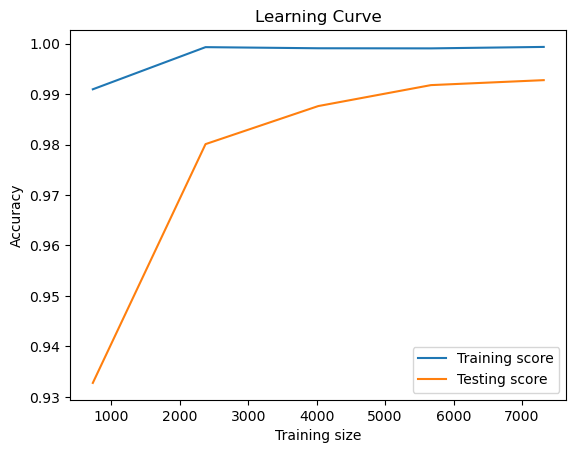

In [74]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, validation_curve

# Plot learning curves to visualize overfitting
train_sizes, train_scores, test_scores = learning_curve(bagging_model_SVM, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_scores_mean = train_scores.mean(axis=1)
test_scores_mean = test_scores.mean(axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, test_scores_mean, label='Testing score')
plt.xlabel('Training size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()

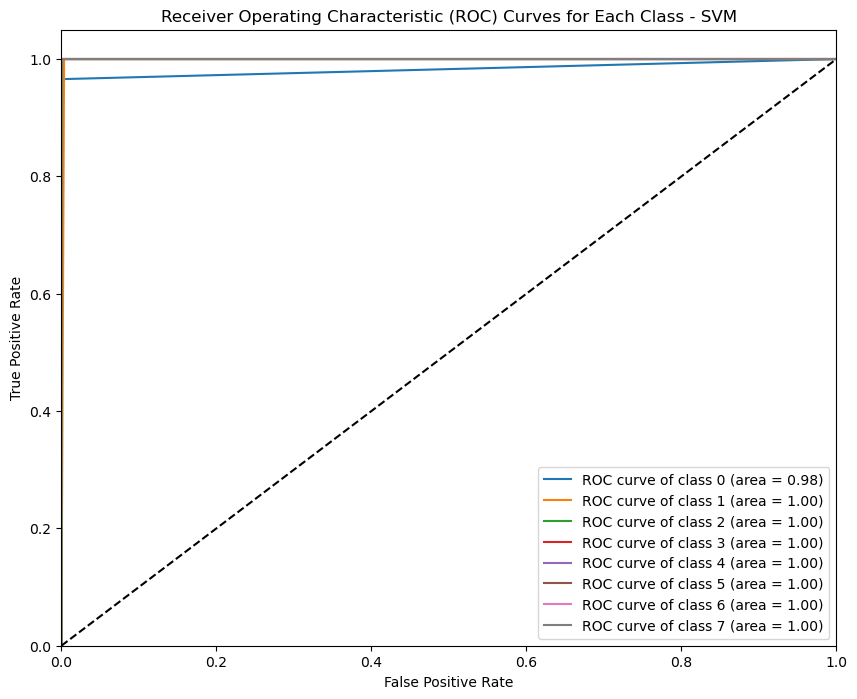

In [40]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Ensure you have 8 target variables
n_classes = 8
# Calculate ROC curve and ROC AUC for each class

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i,y_test_pred_bag_SVM  == i)
    roc_auc[i] = roc_auc_score(y_test == i, y_test_pred_bag_SVM== i)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves for Each Class - SVM')
plt.legend(loc='lower right')
plt.show()


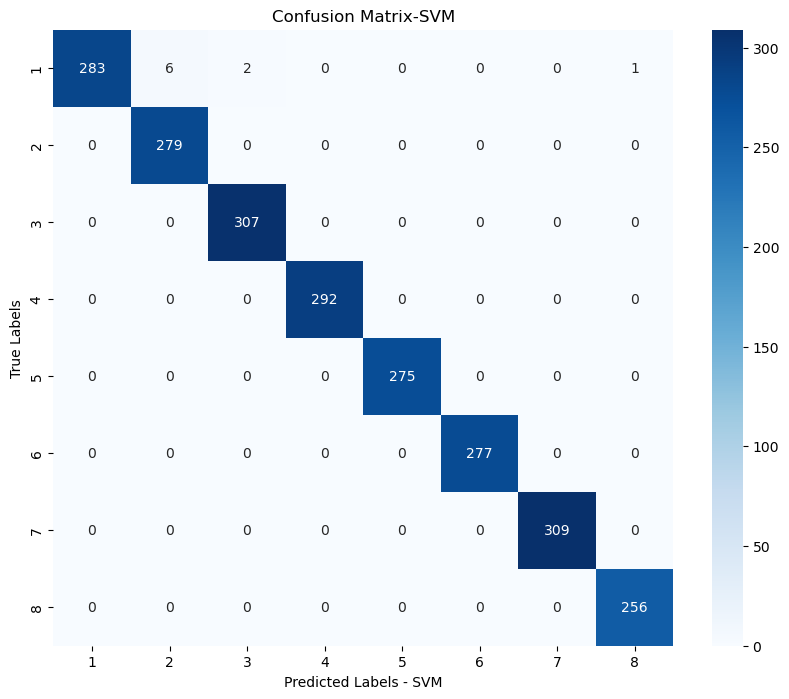

In [42]:
# Calculate confusion matrix
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

cm = confusion_matrix(y_test,y_test_pred_bag_SVM)

# Display confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=range(1, 9), yticklabels=range(1, 9))
plt.title("Confusion Matrix-SVM")
plt.xlabel("Predicted Labels - SVM")
plt.ylabel("True Labels")
plt.show()

###  Model 4- Logistic Regression 

In [44]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Instantiate the Logistic Regression model
model_LR = LogisticRegression(multi_class='ovr', solver='liblinear')

# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10],           # Regularization parameter
    'solver': ['liblinear', 'saga']  # Solver type: 'liblinear' for small datasets or 'saga' for large datasets
}

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(estimator=model_LR, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Perform grid search on the data (assuming x_train_scaled and y_train_resampled are your training data)
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found:")
print(grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_

bagging_model_LR = BaggingClassifier(estimator=best_model, n_estimators=10, random_state=42, n_jobs=-1)

# Train the BaggingClassifier on the training data
bagging_model_LR.fit(X_train, y_train)

# Predict on the training set using BaggingClassifier with Random Forest
y_train_pred_bag_LR = bagging_model_LR.predict(X_train)

# Predict on the test set using BaggingClassifier with Random Forest
y_test_pred_bag_LR = bagging_model_LR.predict(X_test)

# Calculate training accuracy for BaggingClassifier with Random Forest
train_accuracy_bag_LR = accuracy_score(y_train, y_train_pred_bag_LR)

# Calculate testing accuracy for BaggingClassifier with Random Forest
test_accuracy_bag_LR = accuracy_score(y_test, y_test_pred_bag_LR)

# Print training and testing accuracy for BaggingClassifier with Random Forest
print("Bagging with LR Training Accuracy: {:.2f}%".format(train_accuracy_bag_LR * 100))
print("Bagging with Random Forest Testing Accuracy: {:.2f}%".format(test_accuracy_bag_LR * 100))

# Print classification report for BaggingClassifier with Random Forest
print("Bagging with LR Classification Report:")
print(classification_report(y_test, y_test_pred_bag_LR))


accuracy = accuracy_score(y_test, y_test_pred_bag_LR )
print("Prediction Accuracy for random forest :", accuracy)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


C:\Users\hp\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Best parameters found:
{'C': 10, 'solver': 'liblinear'}
Bagging with LR Training Accuracy: 96.15%
Bagging with Random Forest Testing Accuracy: 96.33%
Bagging with LR Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.84      0.88       292
         1.0       0.93      0.92      0.93       279
         2.0       0.97      1.00      0.99       307
         3.0       1.00      1.00      1.00       292
         4.0       0.99      1.00      0.99       275
         5.0       1.00      1.00      1.00       277
         6.0       0.93      0.95      0.94       309
         7.0       0.96      1.00      0.98       256

    accuracy                           0.96      2287
   macro avg       0.96      0.96      0.96      2287
weighted avg       0.96      0.96      0.96      2287

Prediction Accuracy for random forest : 0.9632706602536073


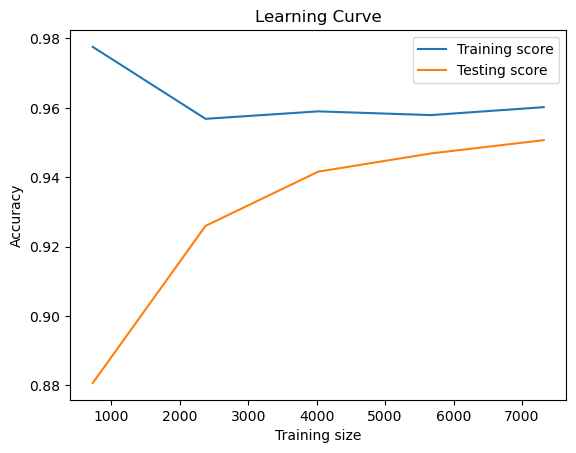

In [58]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, validation_curve

# Plot learning curves to visualize overfitting
train_sizes, train_scores, test_scores = learning_curve(bagging_model_LR, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_scores_mean = train_scores.mean(axis=1)
test_scores_mean = test_scores.mean(axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, test_scores_mean, label='Testing score')
plt.xlabel('Training size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()

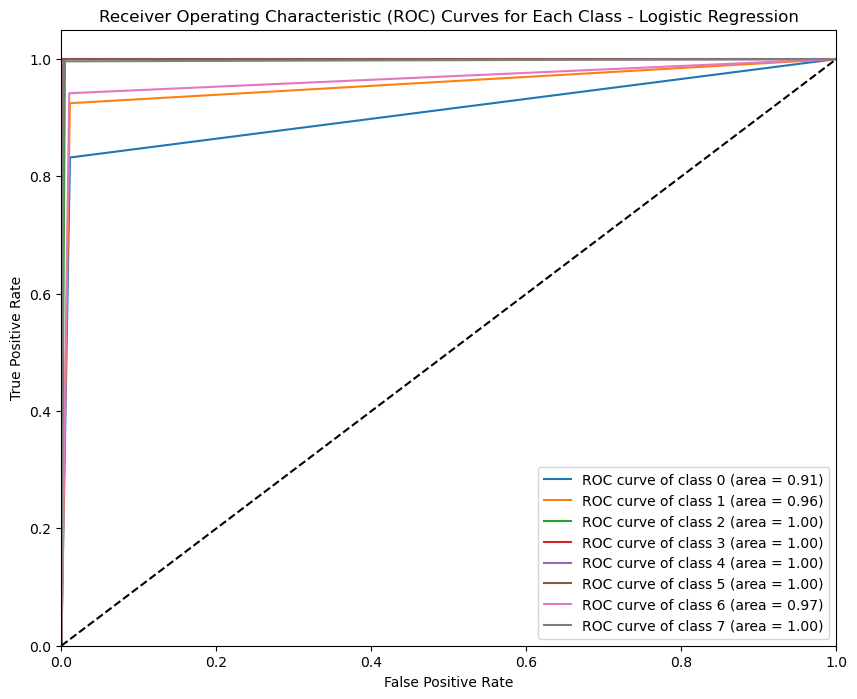

In [59]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Ensure you have 8 target variables
n_classes = 8
# Calculate ROC curve and ROC AUC for each class

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i,y_test_pred_bag_LR  == i)
    roc_auc[i] = roc_auc_score(y_test == i, y_test_pred_bag_LR == i)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves for Each Class - Logistic Regression')
plt.legend(loc='lower right')
plt.show()


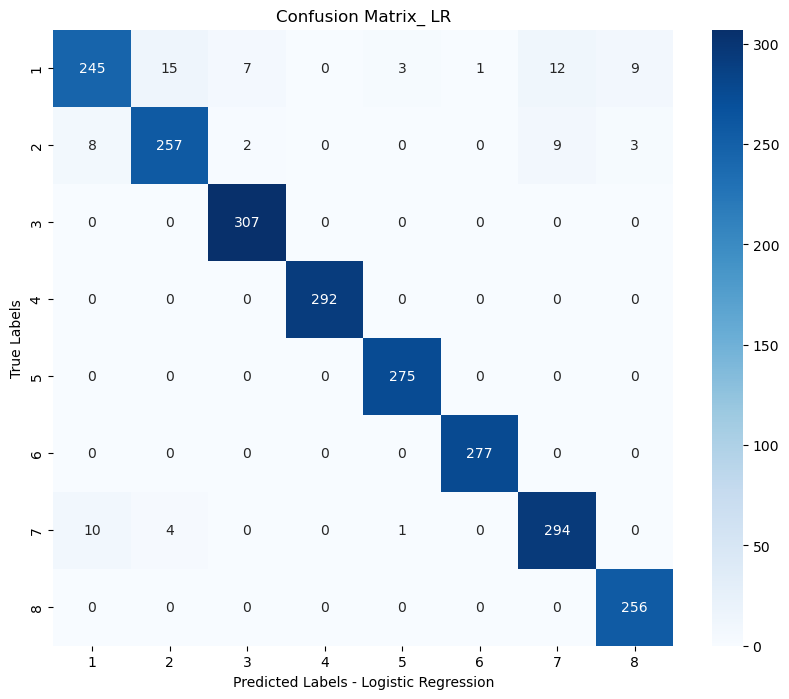

In [45]:
# Calculate confusion matrix
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

cm = confusion_matrix(y_test, y_test_pred_bag_LR)

# Display confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=range(1, 9), yticklabels=range(1, 9))
plt.title("Confusion Matrix_ LR")
plt.xlabel("Predicted Labels - Logistic Regression")
plt.ylabel("True Labels")
plt.show()

## Stochastic Gradient Descent (SGD) 

In [47]:
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import BaggingClassifier

# Instantiate the SGD Classifier model
model_SGD = SGDClassifier(class_weight='balanced', random_state=42)

# Define the parameter grid
param_grid = {
    'loss': ['hinge', 'log'],  # Loss function: 'hinge' for SVM, 'log' for logistic regression
    'alpha': [0.0001, 0.001, 0.01],  # Regularization strength
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive']  # Learning rate schedule
}

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(estimator=model_SGD, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Perform grid search on the data (assuming X_train and y_train are your training data)
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found:")
print(grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_

# Create a Bagging Classifier with the best SGD model
bagging_model_SGD = BaggingClassifier(estimator=best_model, n_estimators=10, random_state=42, n_jobs=-1)

# Train the BaggingClassifier on the training data
bagging_model_SGD.fit(X_train, y_train)

# Predict on the training set using BaggingClassifier
y_train_pred_bag_SGD = bagging_model_SGD.predict(X_train)

# Predict on the test set using BaggingClassifier
y_test_pred_bag_SGD = bagging_model_SGD.predict(X_test)

# Calculate training accuracy for BaggingClassifier
train_accuracy_bag_SGD = accuracy_score(y_train, y_train_pred_bag_SGD)

# Calculate testing accuracy for BaggingClassifier
test_accuracy_bag_SGD = accuracy_score(y_test, y_test_pred_bag_SGD)

# Print training and testing accuracy for BaggingClassifier
print("Bagging with SGD Training Accuracy: {:.2f}%".format(train_accuracy_bag_SGD * 100))
print("Bagging with SGD Testing Accuracy: {:.2f}%".format(test_accuracy_bag_SGD * 100))

# Print classification report for BaggingClassifier
print("Bagging with SGD Classification Report:")
print(classification_report(y_test, y_test_pred_bag_SGD))

# Overall prediction accuracy for BaggingClassifier
accuracy = accuracy_score(y_test, y_test_pred_bag_SGD)
print("Prediction Accuracy for SGD:", accuracy)


Fitting 5 folds for each of 24 candidates, totalling 120 fits


C:\Users\hp\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
105 fits failed out of a total of 120.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
45 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\hp\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\hp\anaconda3\Lib\site-packages\sklearn\base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\hp\anaconda3\Lib\site-packages\sklearn\linear_model\_stochastic_gradient.py", line 936, in fit
    self._more

Best parameters found:
{'alpha': 0.0001, 'learning_rate': 'optimal', 'loss': 'hinge'}
Bagging with SGD Training Accuracy: 94.25%
Bagging with SGD Testing Accuracy: 94.18%
Bagging with SGD Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.85      0.84       292
         1.0       0.90      0.92      0.91       279
         2.0       0.97      0.98      0.97       307
         3.0       1.00      0.98      0.99       292
         4.0       0.96      0.97      0.97       275
         5.0       1.00      0.97      0.99       277
         6.0       0.91      0.88      0.89       309
         7.0       0.98      0.99      0.99       256

    accuracy                           0.94      2287
   macro avg       0.94      0.94      0.94      2287
weighted avg       0.94      0.94      0.94      2287

Prediction Accuracy for SGD: 0.9418452120682116


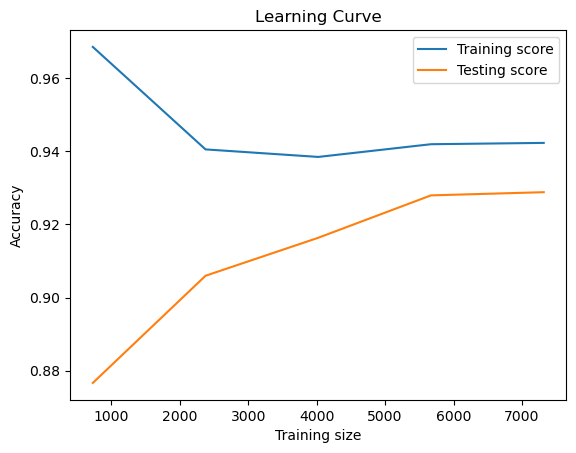

In [48]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, validation_curve

# Plot learning curves to visualize overfitting
train_sizes, train_scores, test_scores = learning_curve(bagging_model_SGD, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_scores_mean = train_scores.mean(axis=1)
test_scores_mean = test_scores.mean(axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, test_scores_mean, label='Testing score')
plt.xlabel('Training size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()

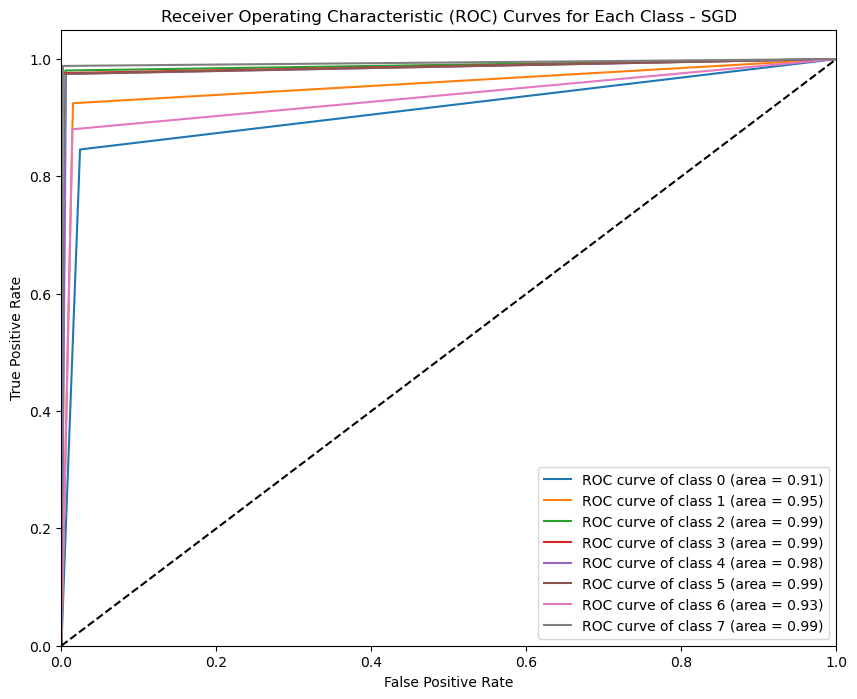

In [52]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Ensure you have 8 target variables
n_classes = 8
# Calculate ROC curve and ROC AUC for each class

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i,y_test_pred_bag_SGD  == i)
    roc_auc[i] = roc_auc_score(y_test == i, y_test_pred_bag_SGD == i)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves for Each Class - SGD')
plt.legend(loc='lower right')
plt.show()


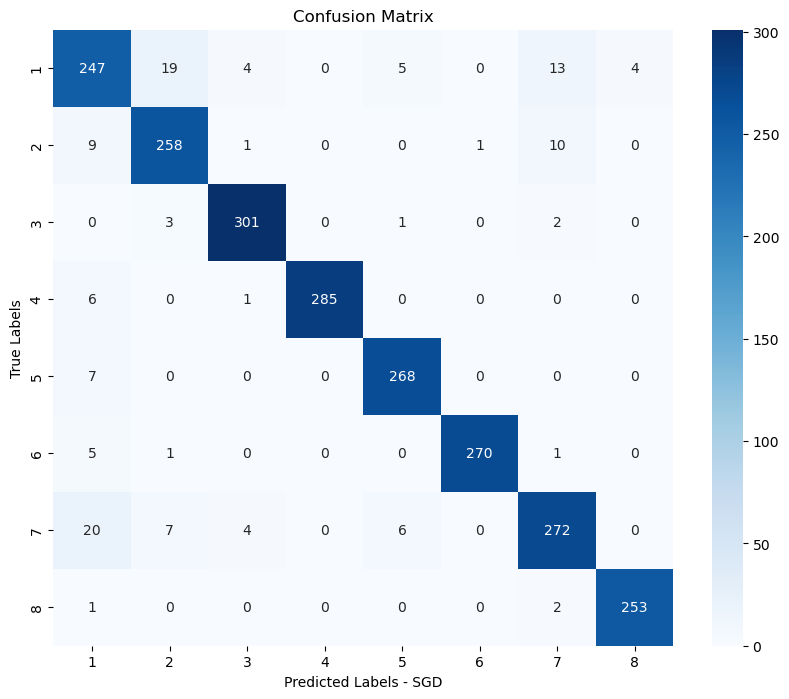

In [53]:
# Calculate confusion matrix
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

cm = confusion_matrix(y_test, y_test_pred_bag_SGD)

# Display confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=range(1, 9), yticklabels=range(1, 9))
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels - SGD")
plt.ylabel("True Labels")
plt.show()

In [46]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import BaggingClassifier

# Instantiate the KNN model
model_knn = KNeighborsClassifier()

# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9],  # Number of neighbors
    'weights': ['uniform', 'distance'],  # Weight function used in prediction
    'metric': ['euclidean', 'manhattan']  # Distance metric
}

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(estimator=model_knn, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Perform grid search on the data (assuming X_train and y_train are your training data)
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found:")
print(grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_

# Create a Bagging Classifier with the best KNN model
bagging_model_knn = BaggingClassifier(estimator=best_model, n_estimators=10, random_state=42, n_jobs=-1)

# Train the BaggingClassifier on the training data
bagging_model_knn.fit(X_train, y_train)

# Predict on the training set using BaggingClassifier
y_train_pred_bag_knn = bagging_model_knn.predict(X_train)

# Predict on the test set using BaggingClassifier
y_test_pred_bag_knn = bagging_model_knn.predict(X_test)

# Calculate training accuracy for BaggingClassifier
train_accuracy_bag_knn = accuracy_score(y_train, y_train_pred_bag_knn)

# Calculate testing accuracy for BaggingClassifier
test_accuracy_bag_knn = accuracy_score(y_test, y_test_pred_bag_knn)

# Print training and testing accuracy for BaggingClassifier
print("Bagging with KNN Training Accuracy: {:.2f}%".format(train_accuracy_bag_knn * 100))
print("Bagging with KNN Testing Accuracy: {:.2f}%".format(test_accuracy_bag_knn * 100))

# Print classification report for BaggingClassifier
print("Bagging with KNN Classification Report:")
print(classification_report(y_test, y_test_pred_bag_knn))

# Overall prediction accuracy for BaggingClassifier
accuracy = accuracy_score(y_test, y_test_pred_bag_knn)
print("Prediction Accuracy for KNN:", accuracy)


Fitting 5 folds for each of 16 candidates, totalling 80 fits
Best parameters found:
{'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'uniform'}
Bagging with KNN Training Accuracy: 97.98%
Bagging with KNN Testing Accuracy: 97.16%
Bagging with KNN Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.78      0.88       292
         1.0       0.94      1.00      0.97       279
         2.0       0.97      1.00      0.98       307
         3.0       0.99      1.00      0.99       292
         4.0       0.96      1.00      0.98       275
         5.0       0.99      1.00      1.00       277
         6.0       0.97      1.00      0.98       309
         7.0       0.97      1.00      0.98       256

    accuracy                           0.97      2287
   macro avg       0.97      0.97      0.97      2287
weighted avg       0.97      0.97      0.97      2287

Prediction Accuracy for KNN: 0.9715784871010057


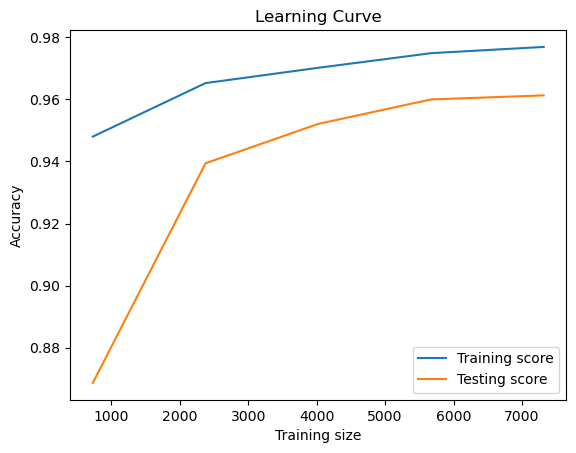

In [54]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, validation_curve

# Plot learning curves to visualize overfitting
train_sizes, train_scores, test_scores = learning_curve(bagging_model_knn, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_scores_mean = train_scores.mean(axis=1)
test_scores_mean = test_scores.mean(axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, test_scores_mean, label='Testing score')
plt.xlabel('Training size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()

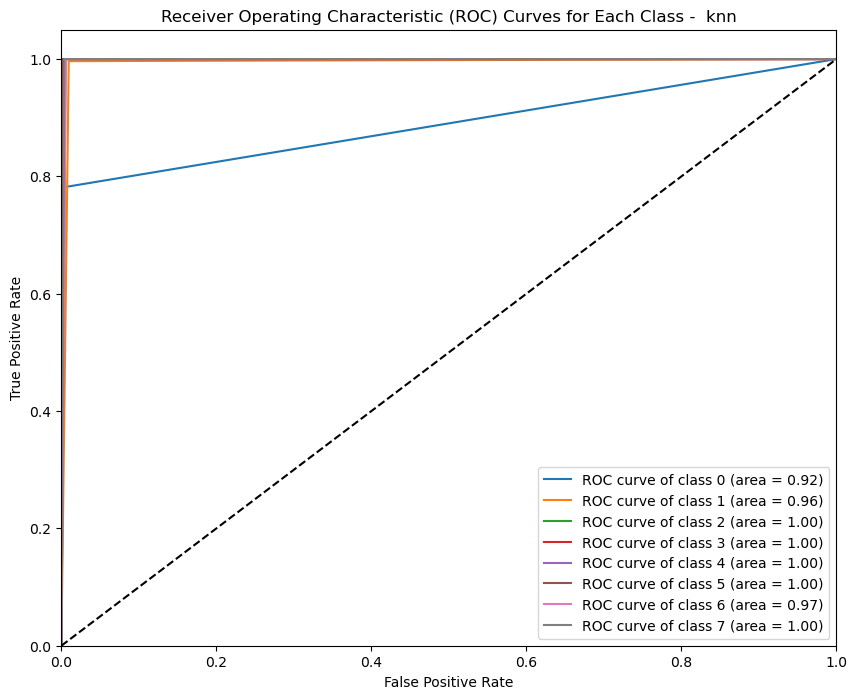

In [47]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Ensure you have 8 target variables
n_classes = 8
# Calculate ROC curve and ROC AUC for each class

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i,y_test_pred_bag_knn  == i)
    roc_auc[i] = roc_auc_score(y_test == i, y_test_pred_bag_LR == i)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves for Each Class -  knn')
plt.legend(loc='lower right')
plt.show()


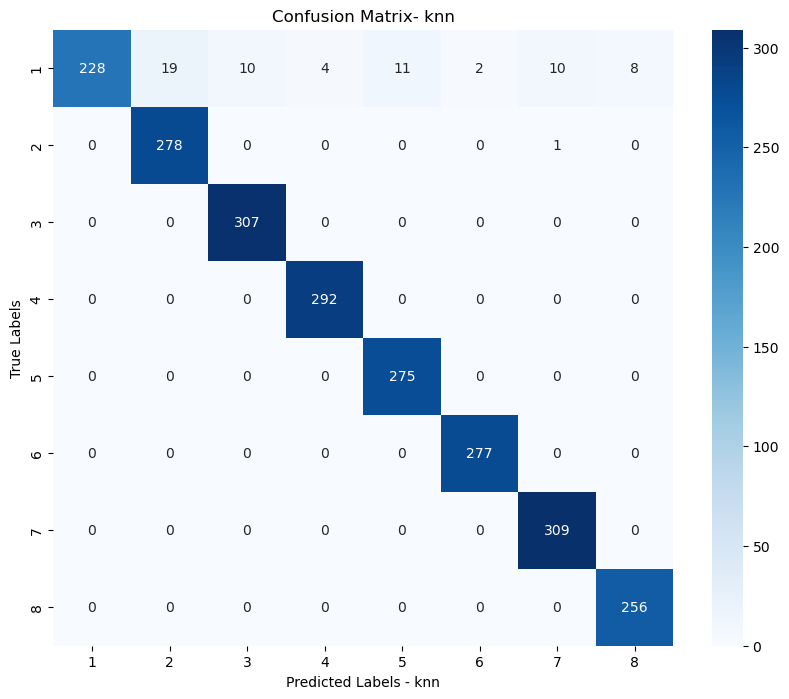

In [48]:
# Calculate confusion matrix
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

cm = confusion_matrix(y_test, y_test_pred_bag_knn)

# Display confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=range(1, 9), yticklabels=range(1, 9))
plt.title("Confusion Matrix- knn")
plt.xlabel("Predicted Labels - knn")
plt.ylabel("True Labels")
plt.show()

##  Decision tree

In [35]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import classification_report, accuracy_score

# Instantiate the DecisionTreeClassifier
model_DT = DecisionTreeClassifier(random_state=42)

# Define the parameter grid for DecisionTreeClassifier
param_grid = {
    'max_depth': [None, 10, 20, 30],       # Maximum depth of the tree
    'min_samples_split': [2, 10, 20],      # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 5, 10],        # Minimum number of samples required to be at a leaf node
}

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(estimator=model_DT, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Perform grid search on the data (assuming X_train and y_train are your training data)
grid_search.fit(X_train, y_train)

# Print the best parameters found
print("Best parameters found:")
print(grid_search.best_params_)

# Get the best model
best_model = grid_search.best_estimator_

# Instantiate BaggingClassifier with the best DecisionTree model
bagging_model_DT = BaggingClassifier(estimator=best_model, n_estimators=10, random_state=42, n_jobs=-1)

# Train the BaggingClassifier on the training data
bagging_model_DT.fit(X_train, y_train)

# Predict on the training set using BaggingClassifier with Decision Tree
y_train_pred_bag_DT = bagging_model_DT.predict(X_train)

# Predict on the test set using BaggingClassifier with Decision Tree
y_test_pred_bag_DT = bagging_model_DT.predict(X_test)

# Calculate training accuracy for BaggingClassifier with Decision Tree
train_accuracy_bag_DT = accuracy_score(y_train, y_train_pred_bag_DT)

# Calculate testing accuracy for BaggingClassifier with Decision Tree
test_accuracy_bag_DT = accuracy_score(y_test, y_test_pred_bag_DT)

# Print training and testing accuracy for BaggingClassifier with Decision Tree
print("Bagging with Decision Tree Training Accuracy: {:.2f}%".format(train_accuracy_bag_DT * 100))
print("Bagging with Decision Tree Testing Accuracy: {:.2f}%".format(test_accuracy_bag_DT * 100))

# Print classification report for BaggingClassifier with Decision Tree
print("Bagging with Decision Tree Classification Report:")
print(classification_report(y_test, y_test_pred_bag_DT))

# Calculate and print overall prediction accuracy
accuracy = accuracy_score(y_test, y_test_pred_bag_DT)
print("Prediction Accuracy for Decision Tree with Bagging:", accuracy)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters found:
{'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Bagging with Decision Tree Training Accuracy: 99.96%
Bagging with Decision Tree Testing Accuracy: 96.81%
Bagging with Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.85      0.89       292
         1.0       0.92      0.97      0.95       279
         2.0       0.98      0.99      0.99       307
         3.0       0.99      0.98      0.98       292
         4.0       0.96      0.99      0.97       275
         5.0       0.99      1.00      0.99       277
         6.0       0.97      0.98      0.98       309
         7.0       0.98      0.98      0.98       256

    accuracy                           0.97      2287
   macro avg       0.97      0.97      0.97      2287
weighted avg       0.97      0.97      0.97      2287

Prediction Accuracy for Decision Tree with

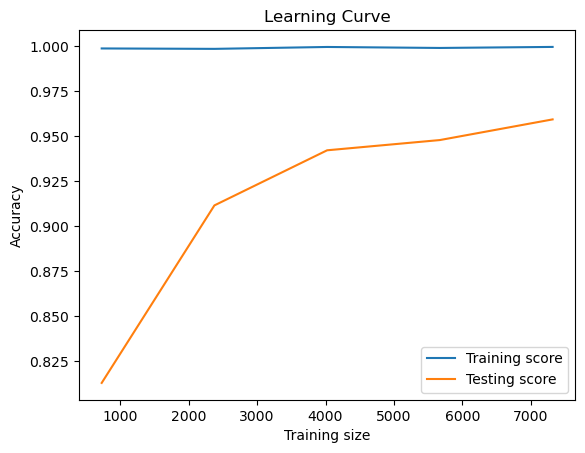

In [36]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, validation_curve

# Plot learning curves to visualize overfitting
train_sizes, train_scores, test_scores = learning_curve(bagging_model_DT, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

train_scores_mean = train_scores.mean(axis=1)
test_scores_mean = test_scores.mean(axis=1)

plt.plot(train_sizes, train_scores_mean, label='Training score')
plt.plot(train_sizes, test_scores_mean, label='Testing score')
plt.xlabel('Training size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()

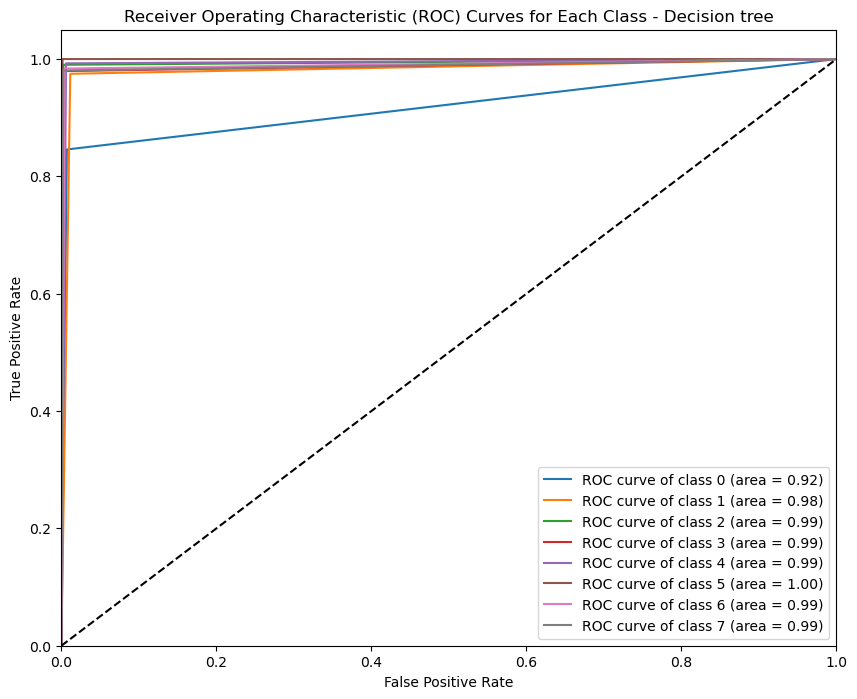

In [49]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# Ensure you have 8 target variables
n_classes = 8
# Calculate ROC curve and ROC AUC for each class

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i,y_test_pred_bag_DT  == i)
    roc_auc[i] = roc_auc_score(y_test == i, y_test_pred_bag_DT == i)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'ROC curve of class {i} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves for Each Class - Decision tree')
plt.legend(loc='lower right')
plt.show()


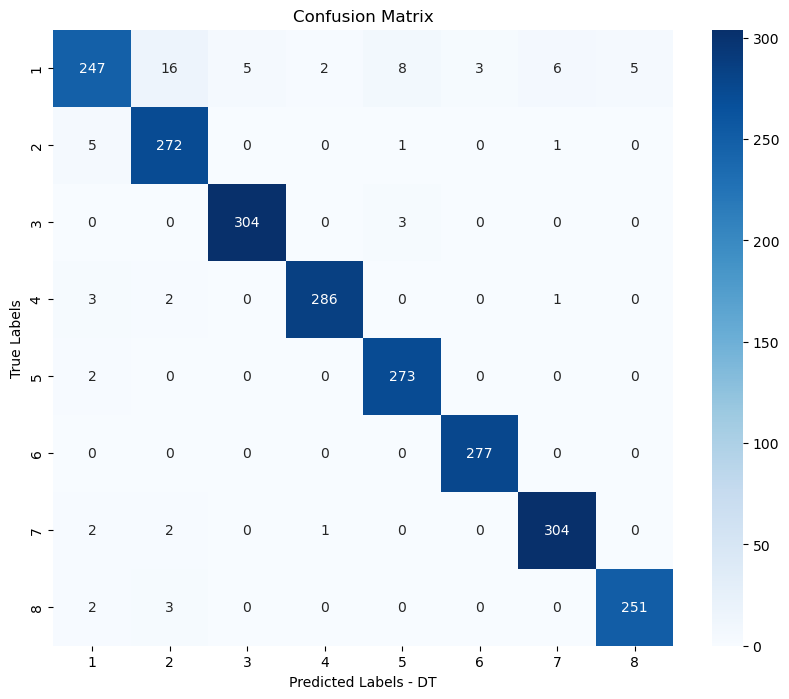

In [51]:
# Calculate confusion matrix
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

cm = confusion_matrix(y_test, y_test_pred_bag_DT)

# Display confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=range(1, 9), yticklabels=range(1, 9))
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels - DT")
plt.ylabel("True Labels")
plt.show()